In [1]:
library(IRdisplay)
display_html("<style>.container { width:100% !important; }</style>")

In [2]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(purrr))
suppressPackageStartupMessages(library(deMULTIplex))
suppressPackageStartupMessages(library(optparse))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(dplyr))

In [3]:
opts <- list()
opts$inputdir <- "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/"
opts$settings <- "/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/pipeline/processing/settings.R"
opts$experiment <- "MULTI/exp6_d4.5_d5"
opts$sample <- "sampleA"
source(opts$settings)

In [4]:
full_outbase <- paste0(opts$inputdir, opts$experiment, "/")
final.calls.rescued <- readRDS(paste0(full_outbase, opts$sample, "_finalCalls.rds"))
final.calls.rescued

AGAGAGCAGAGTCACG AGAGAGCAGCACTGGA AGAGAGCCAACGGCCT AGAGAGCCAGTTTGGT 
         "Bar10"          "Bar66"        "Doublet"        "Doublet" 
AGAGAGCGTGTCTTGA AGAGAGCGTTCCCACT AGAGAGCTCCATCTGC AGAGAGCTCTAATTCC 
         "Bar12"          "Bar18"          "Bar55"          "Bar10" 
AGAGAGCTCTGGGTCG AACACACGTCGATTTG AGAGCAGAGCTACTAC AGAGCAGCACTTCAGA 
          "Bar4"          "Bar47"        "Doublet"           "Bar2" 
AGAGCAGGTCAGCGTC AGAGCAGTCAAGGAGC AGAGCAGTCATCCCGT AGAGCAGTCCCTCTCC 
         "Bar59"          "Bar14"          "Bar13"          "Bar23" 
AGAGCAGTCCGTATAG AGAGCAGTCCTACAAG AGAGCCCAGCCTCATA AGAGCCCAGTGCTAGG 
          "Bar7"          "Bar14"        "Doublet"          "Bar47" 
AGAGCCCCAAATCGTC AGAGCCCTCCGCGGAT AGAGCCCTCGCTTAAG AGATAGAAGGTATCTC 
         "Bar25"          "Bar24"          "Bar12"          "Bar17" 
AGATAGAAGGTTCATC AGATAGACAATCGCAT AGATAGATCAGCTGTA AGATAGATCCGTGACG 
         "Bar14"          "Bar61"          "Bar24"          "Bar30" 
AGATAGATCCTTGGAA AGATCCAAGAATCCCT AGATCCAAGCAACTTC AGATCCAAGCAGCCTC 
         "Bar20"           "Bar1"          "Bar24"          "Bar19" 
AGATCCACAAAGGGTC AGATCCACACTCCGAG AGATCCACAGTACTAC AGATCCACATCTCAAG 
         "Bar10"          "Bar15"          "Bar14"          "Bar55" 
AGATCCAGTTCGGTTA AGATCCATCAACTGAC AGATCCATCCGTAGTA AGATCCATCTGAGATC 
         "Bar13"           "Bar2"          "Bar10"          "Bar13" 
AGATCGTAGACAAGCC AACAGGGAGGTCATTC AGATCGTAGCAGCGAT AGATCGTAGGAAACGA 
         "Bar17"           "Bar1"          "Bar30"           "Bar2" 
AGATCGTAGGCCTAAG AGATCGTAGTCAATCC AGATCGTTCCTTCGAC AGATCGTTCTCAGTCC 
         "Bar12"          "Bar12"          "Bar12"           "Bar7" 
AGATGAAGTGGAGGTT AGATGAAGTGTCGCTG AACAGGGAGTGTGTTC AGATGAAGTGTTGATC 
         "Bar17"          "Bar49"          "Bar59"        "Doublet" 
AGATGAATCACTGGTA AGATGCTCACTTTATC AGATGCTCATCCTTCG AGATGCTGTTGTGTTG 
         "Bar13"          "Bar14"          "Bar19"          "Bar56" 
AGATGCTTCTTGAGCA AGCATCAAGACTAAGT AGCATCACACAGACGA AGCATCACATATGGCT 
          "Bar2"          "Bar59"          "Bar66"          "Bar55" 
AGCATCAGTCCGCAGT AGCATCATCTAGGCCG AGCCAATAGAAAGTCT AGCCAATTCTTCCACG 
         "Bar15"          "Bar14"          "Bar17"           "Bar2" 
AACAGGGGTAGACTGG AGCCACGCAAGACTGG AGCCACGCAAGGCCTC AGCCACGGTCTGTTAG 
         "Bar20"          "Bar24"          "Bar65"          "Bar15" 
AGCCAGCCACAGTATC AGCCAGCCAGGGTTGA AGCCAGCGTAGATTAG AGCCAGCTCAGGAGAC 
       "Doublet"          "Bar14"          "Bar17"          "Bar12" 
AGCCAGCTCTAAGAAG AGCGATTAGCAGCCCT AGCGATTCACGGTGCT AGCGATTGTACGGCAA 
          "Bar2"          "Bar49"          "Bar47"          "Bar49" 
AAACGAAGTAGCACAG AGCGATTGTGCTTATG AGCGATTTCCCATAGA AGCGATTTCTTTGCTA 
         "Bar28"          "Bar13"          "Bar56"           "Bar4" 
AGCGCCAAGGGACAGG AGCGCCACAGAGAGGG AGCGCCAGTTGTCAGT AGCGCCATCGAAGCCC 
         "Bar15"           "Bar1"          "Bar19"          "Bar18" 
AACAGGGTCAGCACCG AGCGCTGAGCACTCTA AGCGCTGAGGACAGCT AGCGCTGAGTAGTGCG 
         "Bar18"        "Doublet"        "Doublet"          "Bar59" 
AGCGCTGGTACAGAGC AGCGCTGGTGGCCACT AGCGCTGGTTATCTGG AGCGCTGTCATTTGCT 
         "Bar52"          "Bar19"          "Bar14"           "Bar6" 
AGCGCTGTCTGGTCAA AGCGTATCAACGGCTC AGCGTATTCCGATTAG AGCGTATTCCGGTAAT 
         "Bar66"          "Bar18"          "Bar52"           "Bar2" 
AGCGTATTCGTGTCAA AGCGTCGGTTCCACGG AGCTACAAGCGAACTG AACCAACCAGTTTGGT 
         "Bar19"           "Bar7"        "Doublet"        "Doublet" 
AGCTACACACGCGCTA AGCTACACAGGACGAT AGCTACACAGGGATAC AGCTACAGTGGTTCTA 
         "Bar19"          "Bar21"          "Bar17"          "Bar55" 
AGCTACATCCCGGTAG AGCTACATCTTAGCCC AGCTCAACAGGATGAC AGCTCAAGTCCGTACG 
         "Bar21"        "Doublet"          "Bar12"          "Bar65" 
AGCTCAATCCGCATAA AGCTTCCCAAGTGGTG AGCTTCCCACCGGAAA AGCTTCCGTAATGTGA 
          "Bar7"          "Bar19"          "Bar59"          "Bar19" 
AGCTTCCGTCTCGCGA AGCTTCCTCCGAAGGA AGCTTCCTCGATACGT AGCTTCCTCGGACCAC 
         "Bar52"           "Bar7"          "Bar55"        "Doublet"

In [5]:
bar.table <- readRDS(paste0(opts$inputdir,opts$experiment,"/",opts$sample,"_barTable.rds"))

In [6]:
bar.table$MULTI_class <- final.calls.rescued[rownames(bar.table)]

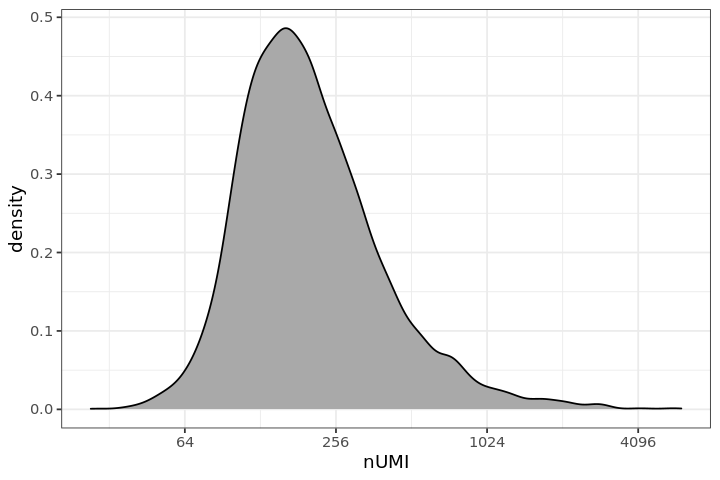

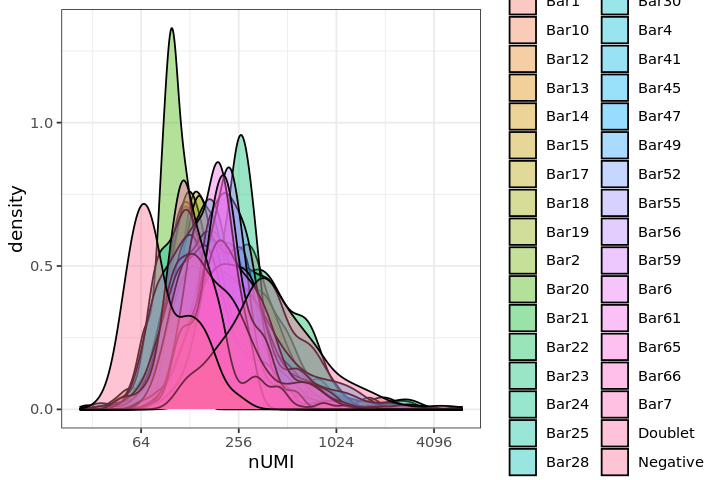

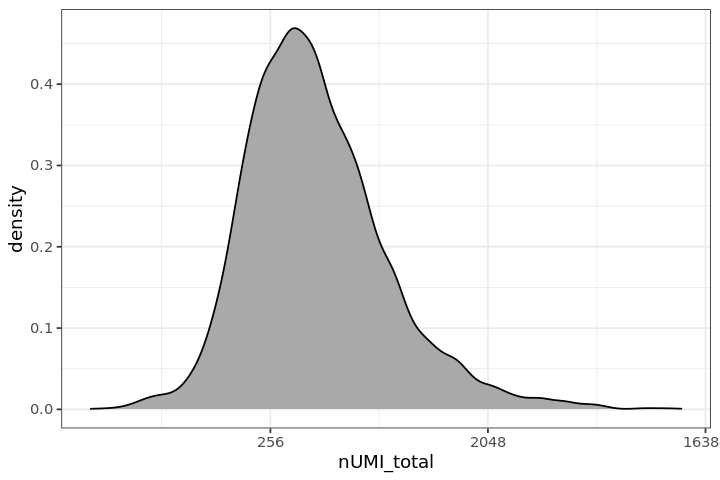

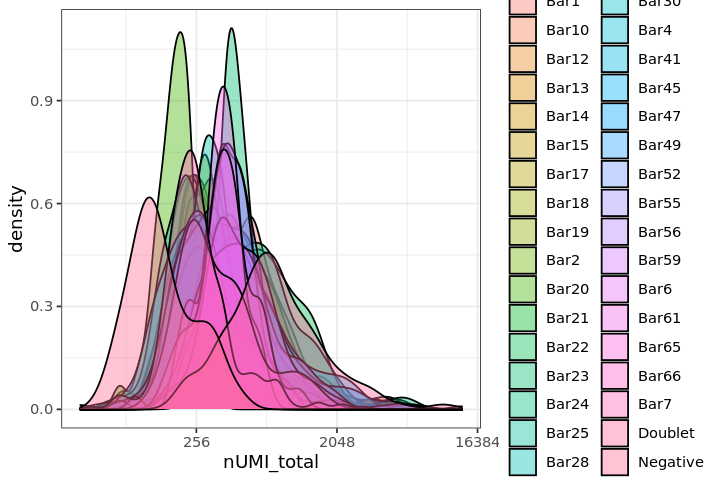

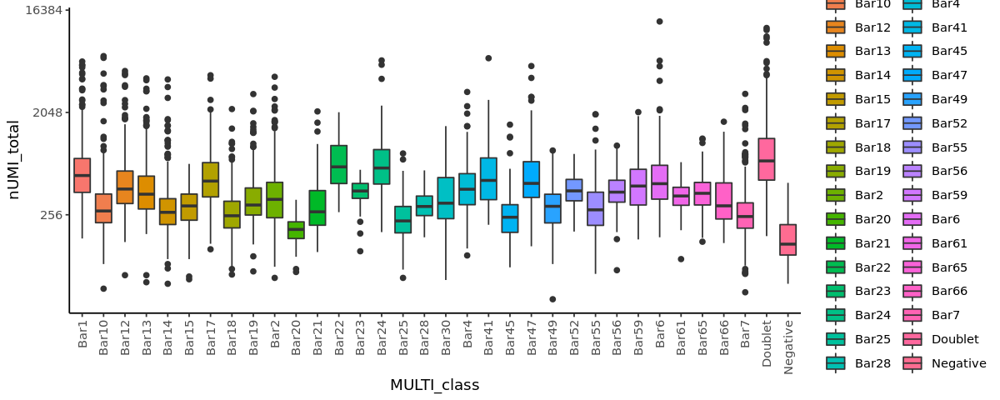

In [7]:
options(repr.plot.width=6, repr.plot.height=4)

p <- ggplot(bar.table, aes(x=nUMI)) +
    geom_density(fill="darkgrey") +
    scale_x_continuous(trans="log2") +
    theme_bw()
print(p)

p <- ggplot(bar.table, aes(x=nUMI, fill=MULTI_class)) +
    geom_density(alpha=0.4) +
    scale_x_continuous(trans="log2") +
    theme_bw()
print(p)

p <- ggplot(bar.table, aes(x=nUMI_total)) +
    geom_density(fill="darkgrey") +
    scale_x_continuous(trans="log2") +
    theme_bw()
print(p)

p <- ggplot(bar.table, aes(x=nUMI_total, fill=MULTI_class)) +
    geom_density(alpha=0.4) +
    scale_x_continuous(trans="log2") +
    theme_bw()
print(p)

options(repr.plot.width=10, repr.plot.height=4)
p <- ggplot(bar.table, aes(y=nUMI_total, x=MULTI_class, fill=MULTI_class)) +
    geom_boxplot() +
    scale_y_continuous(trans="log2") +
    theme_classic() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))

print(p)

Loading required package: Rtsne



Performing PCA
Read the 5805 x 32 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
Done in 4.97 seconds (sparsity = 0.020297)!
Learning embedding...
Iteration 50: error is 90.276874 (50 iterations in 1.26 seconds)
Iteration 100: error is 68.686656 (50 iterations in 1.25 seconds)
Iteration 150: error is 63.470485 (50 iterations in 1.23 seconds)
Iteration 200: error is 61.214935 (50 iterations in 1.25 seconds)
Iteration 250: error is 59.983081 (50 iterations in 1.26 seconds)
Iteration 300: error is 2.100716 (50 iterations in 1.08 seconds)
Iteration 350: error is 1.853992 (50 iterations in 0.99 seconds)
Iteration 400: error is 1.709443 (50 iterations in 0.97 seconds)
Iteration 450: error is 1.618865 (50 iterations in 0.97 seconds)
Iteration 500: error is 1.557172 (50 iterations in 0.98 seconds)
Iteration 550: error is 1.513064 (50 iterations in 0.98 seconds)
Iteration 60

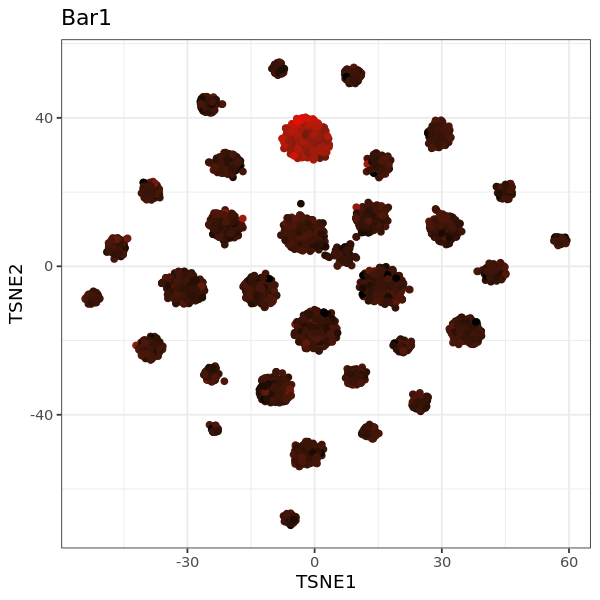

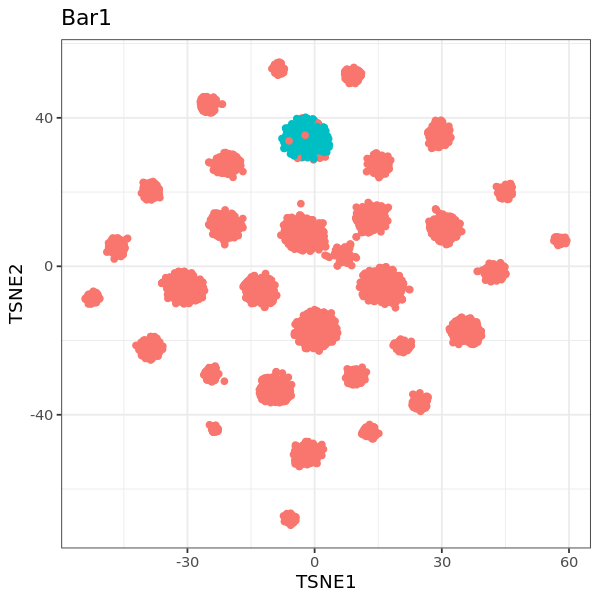

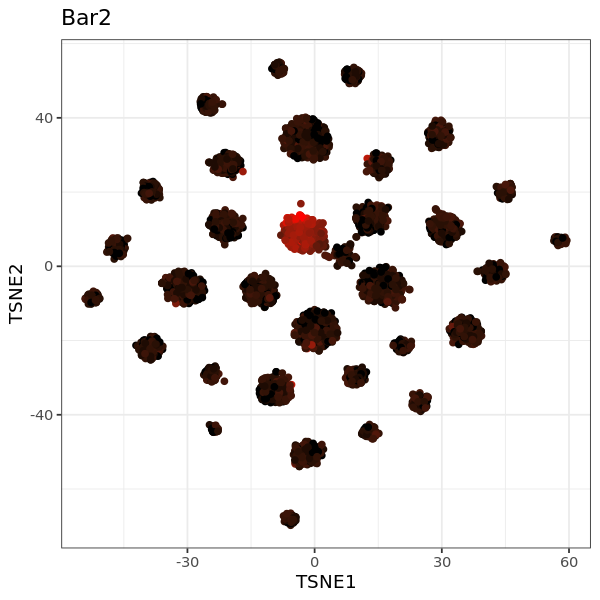

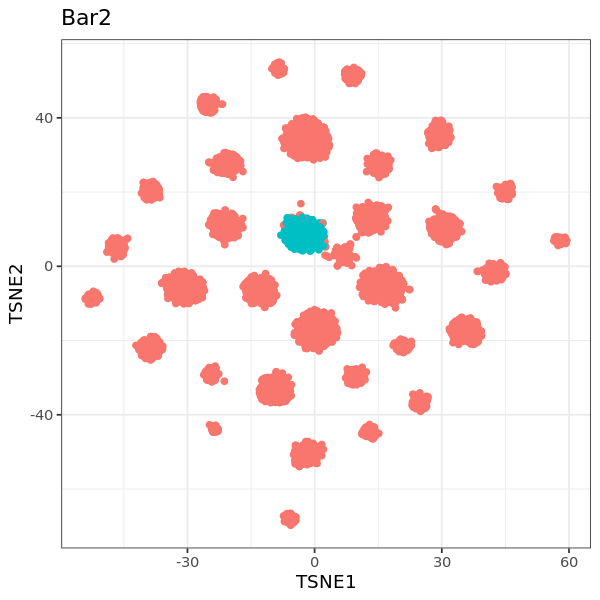

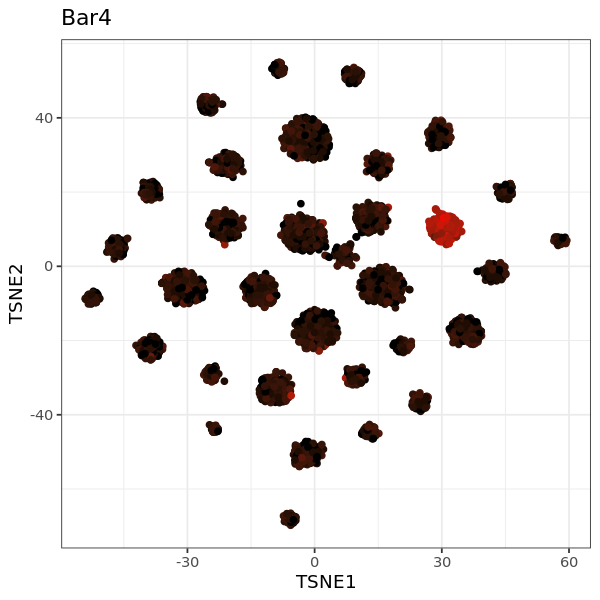

...

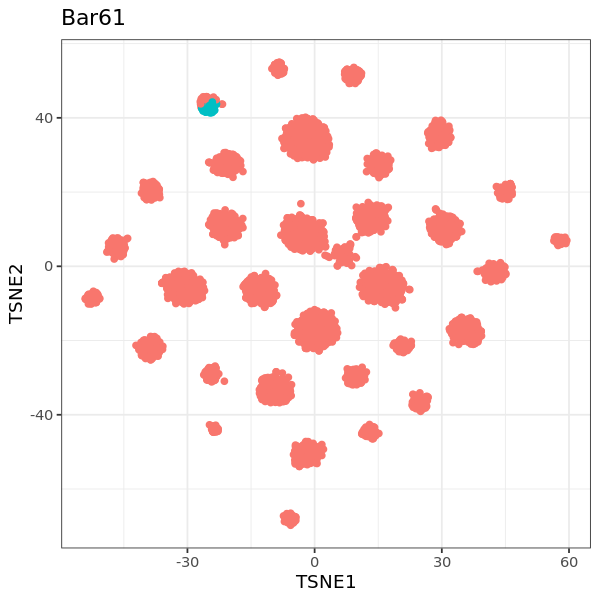

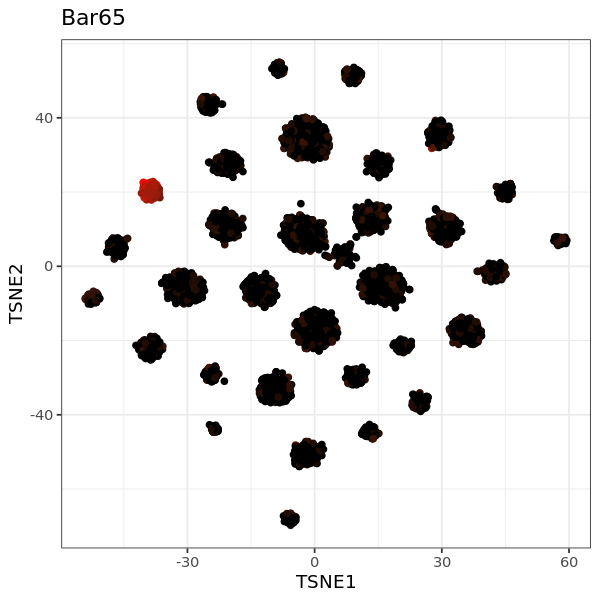

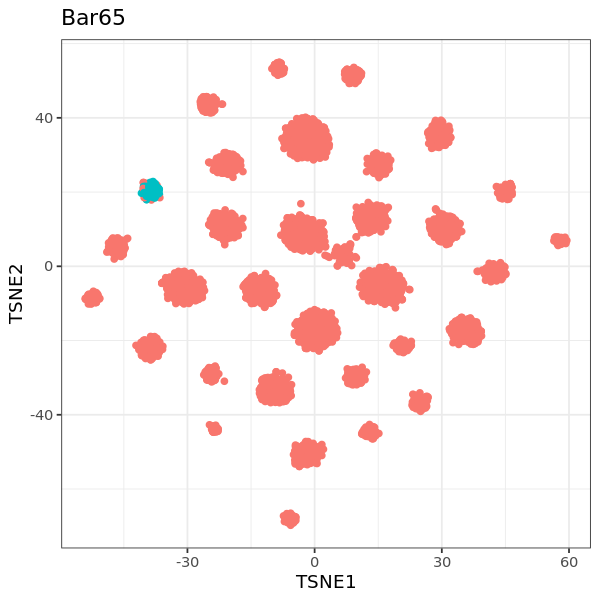

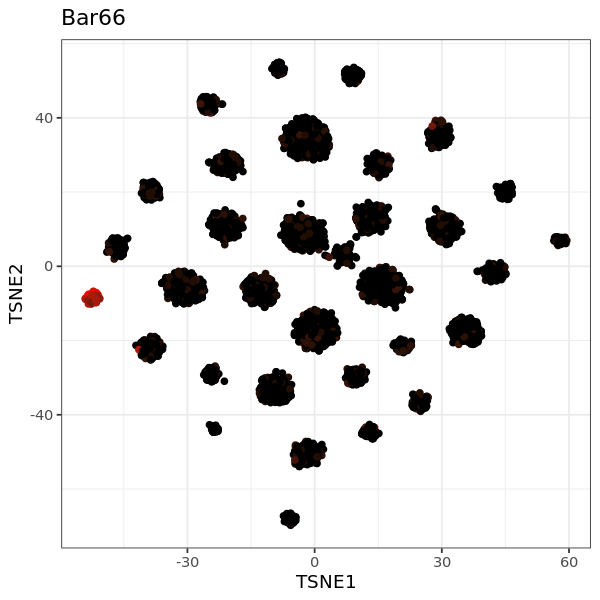

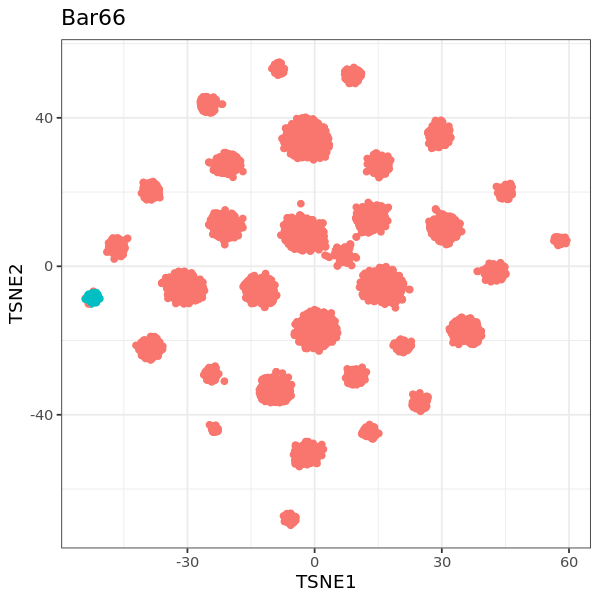

In [8]:
## Visualize barcode space
bar.tsne <- barTSNE(bar.table[,io$bars_used[[opts$experiment]][[opts$sample]]])
bar.tsne$MULTI_class <- final.calls.rescued[rownames(bar.tsne)]
options(repr.plot.width=5, repr.plot.height=5)
for (i in 3:(ncol(bar.tsne)-1)) {
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = bar.tsne[,i])) +
        geom_point() +
        scale_color_gradient(low = "black", high = "red") +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = MULTI_class == colnames(bar.tsne)[i])) +
        geom_point() +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
}

Performing PCA
Read the 5805 x 29 data matrix successfully!
OpenMP is working. 1 threads.
Using no_dims = 2, perplexity = 30.000000, and theta = 0.500000
Computing input similarities...
Building tree...
Done in 4.71 seconds (sparsity = 0.020658)!
Learning embedding...
Iteration 50: error is 90.385263 (50 iterations in 1.20 seconds)
Iteration 100: error is 69.983837 (50 iterations in 1.27 seconds)
Iteration 150: error is 65.225277 (50 iterations in 1.29 seconds)
Iteration 200: error is 63.243722 (50 iterations in 1.32 seconds)
Iteration 250: error is 62.099948 (50 iterations in 1.38 seconds)
Iteration 300: error is 2.191523 (50 iterations in 1.13 seconds)
Iteration 350: error is 1.931770 (50 iterations in 1.03 seconds)
Iteration 400: error is 1.788382 (50 iterations in 1.02 seconds)
Iteration 450: error is 1.697844 (50 iterations in 1.01 seconds)
Iteration 500: error is 1.639300 (50 iterations in 1.07 seconds)
Iteration 550: error is 1.597068 (50 iterations in 1.04 seconds)
Iteration 60

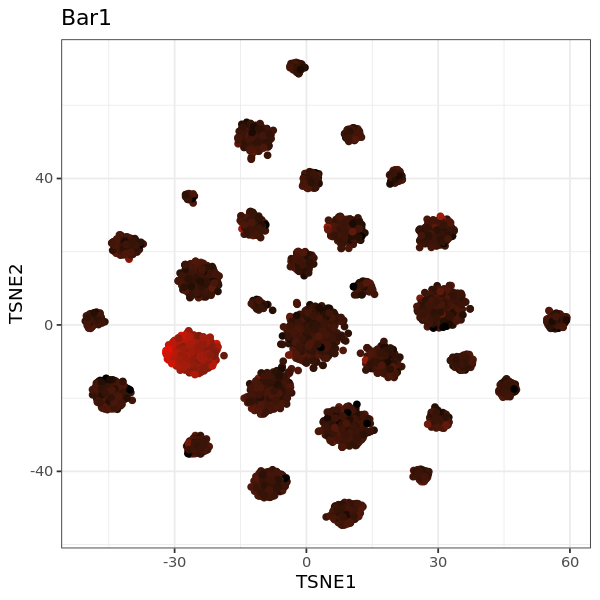

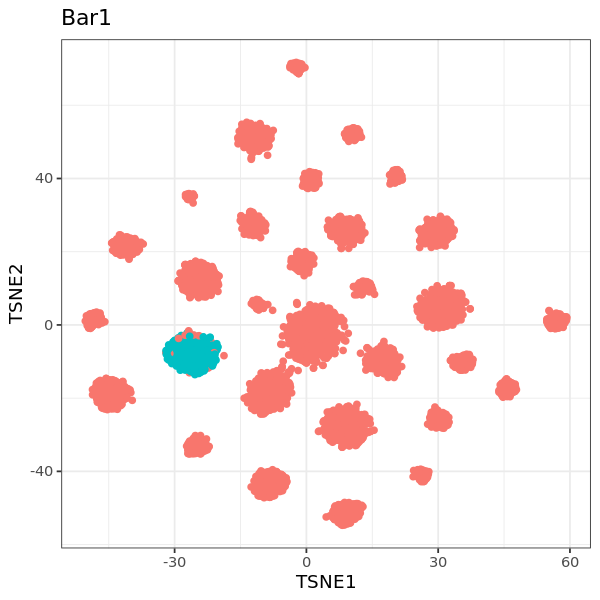

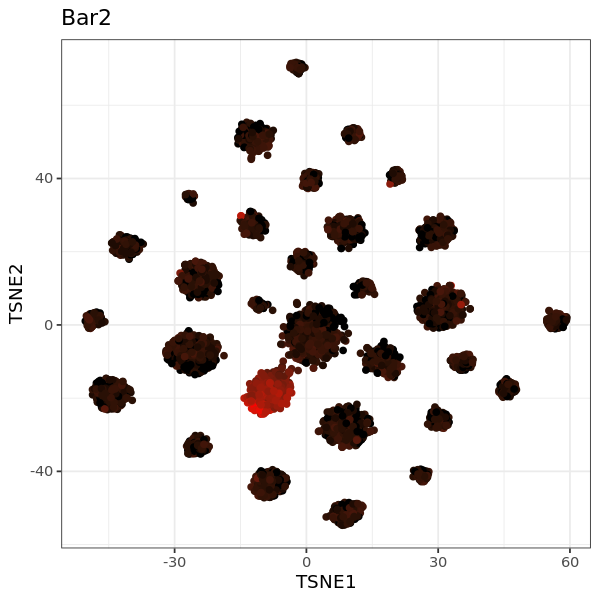

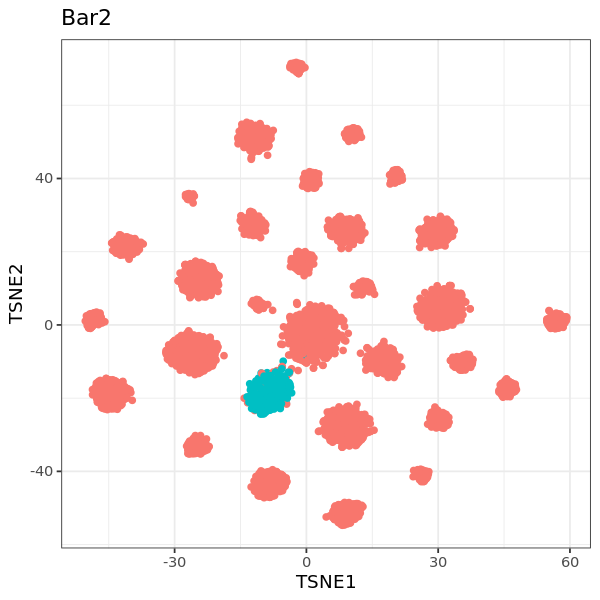

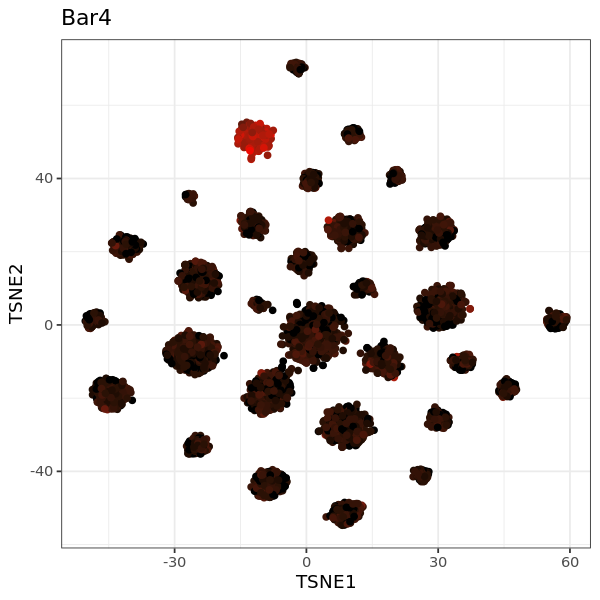

...

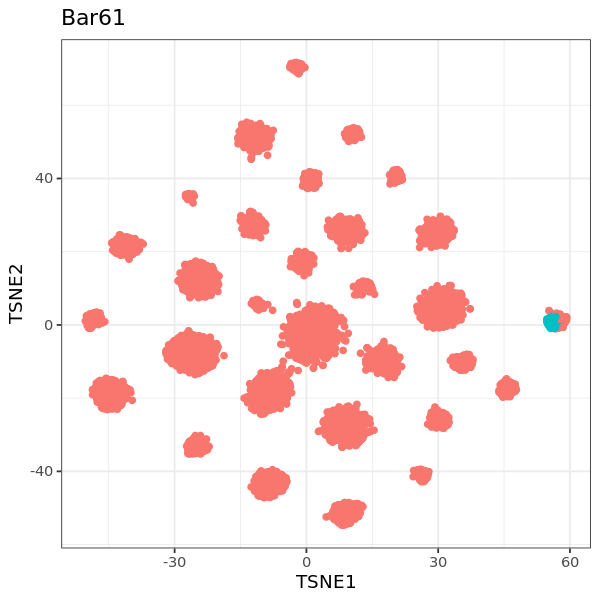

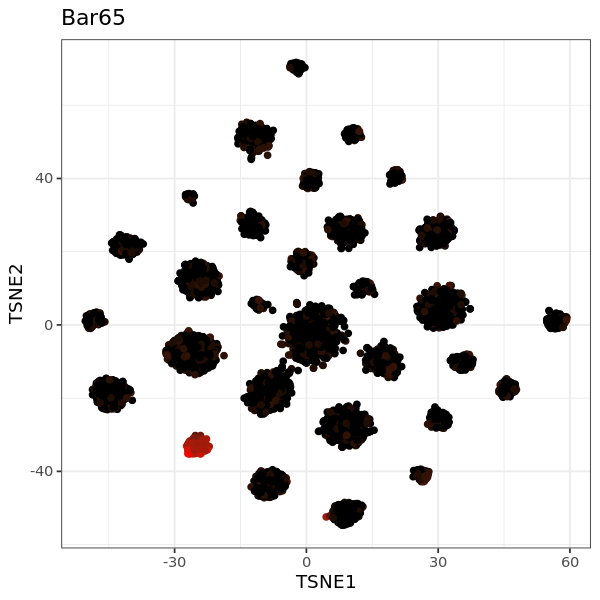

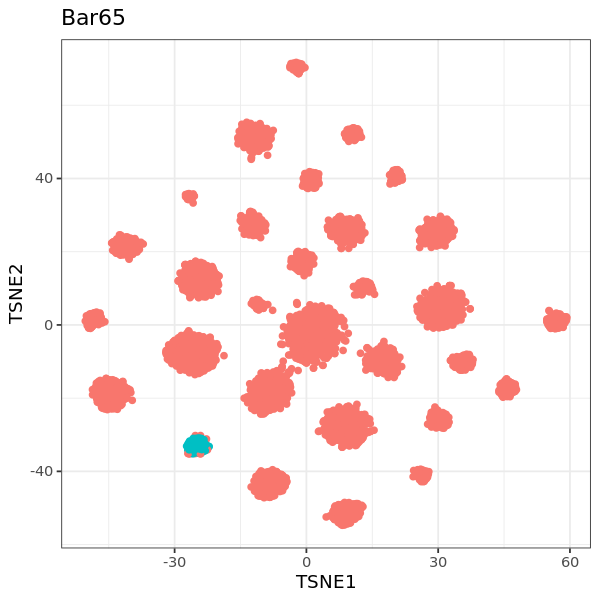

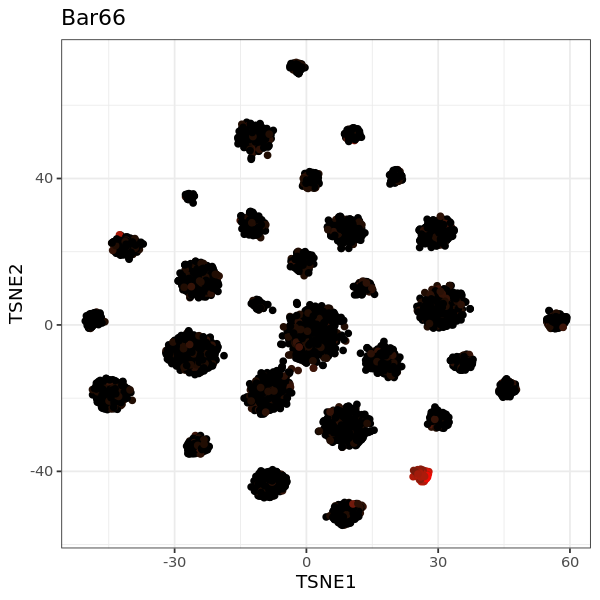

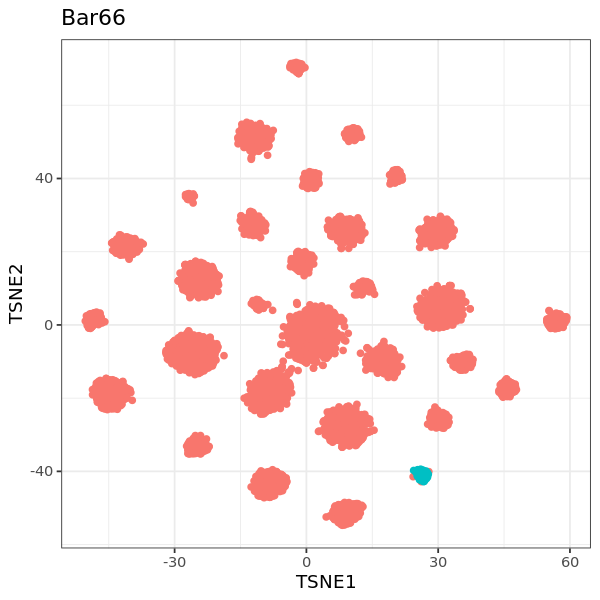

In [9]:
## Visualize barcode space
cols <- io$bars_used[[opts$experiment]][[opts$sample]]
cols <- cols[!(cols %in% c(6, 12, 24))]
bar.tsne.new <- barTSNE(bar.table[,cols])
bar.tsne.new$MULTI_class <- final.calls.rescued[rownames(bar.tsne.new)]
options(repr.plot.width=5, repr.plot.height=5)
for (i in 3:(ncol(bar.tsne.new)-1)) {
    p <- ggplot(bar.tsne.new, aes(x = TSNE1, y = TSNE2, color = bar.tsne.new[,i])) +
        geom_point() +
        scale_color_gradient(low = "black", high = "red") +
        ggtitle(colnames(bar.tsne.new)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    p <- ggplot(bar.tsne.new, aes(x = TSNE1, y = TSNE2, color = MULTI_class == colnames(bar.tsne.new)[i])) +
        geom_point() +
        ggtitle(colnames(bar.tsne.new)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
}

In [10]:
bar.table.full <- bar.table[,1:96]
good.bars <- paste("Bar",io$bars_used[[opts$experiment]][[opts$sample]],sep="")  # Barcodes 1:24 were detected
#good.bars <- good.bars[!(good.bars %in% c('Bar24', 'Bar6', 'Bar12'))]
bar.table <- bar.table.full[, good.bars]  # Remove missing bars and summary columns

bar.table_sweep.list <- list()
n <- 0
for (q in seq(0.01, 0.99, by=0.02)) {
  #print(q)
  n <- n + 1
  bar.table_sweep.list[[n]] <- classifyCells(bar.table, q=q)
  names(bar.table_sweep.list)[n] <- paste("q=",q,sep="")
}

Loading required package: KernSmooth

KernSmooth 2.23 loaded
Copyright M. P. Wand 1997-2009



Loading required package: reshape2


Attaching package: ‘reshape2’


The following objects are masked from ‘package:data.table’:

    dcast, melt




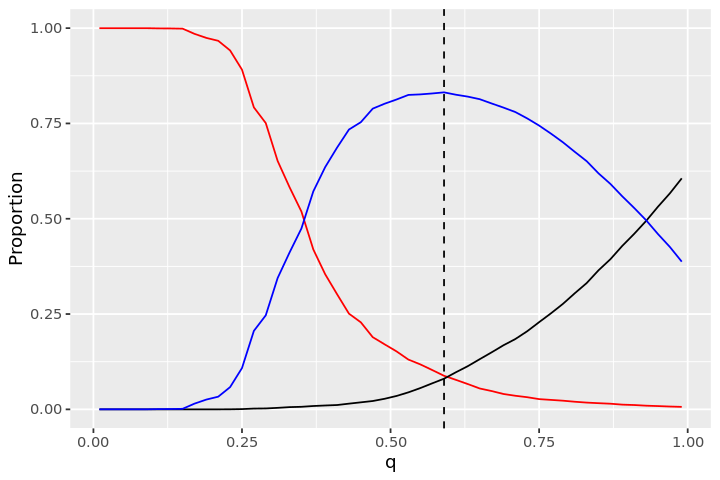

In [11]:
## Round 1 -----------------------------------------------------------------------------------------------------
## Perform Quantile Sweep

i <- 1
bar.table_sweep.list <- list()
n <- 0
for (q in seq(0.01, 0.99, by=0.02)) {
  n <- n + 1
  bar.table_sweep.list[[n]] <- classifyCells(bar.table, q=q)
  names(bar.table_sweep.list)[n] <- paste("q=",q,sep="")
}

## Identify ideal inter-maxima quantile to set barcode-specific thresholds

threshold.results <- findThresh(call.list=bar.table_sweep.list)
options(repr.plot.width=6, repr.plot.height=4)
p <- ggplot(data=threshold.results$res, aes(x=q, y=Proportion, color=Subset)) + geom_line() + theme(legend.position = "none") +
  geom_vline(xintercept=threshold.results$extrema, lty=2) + scale_color_manual(values=c("red","black","blue"))
print(p)

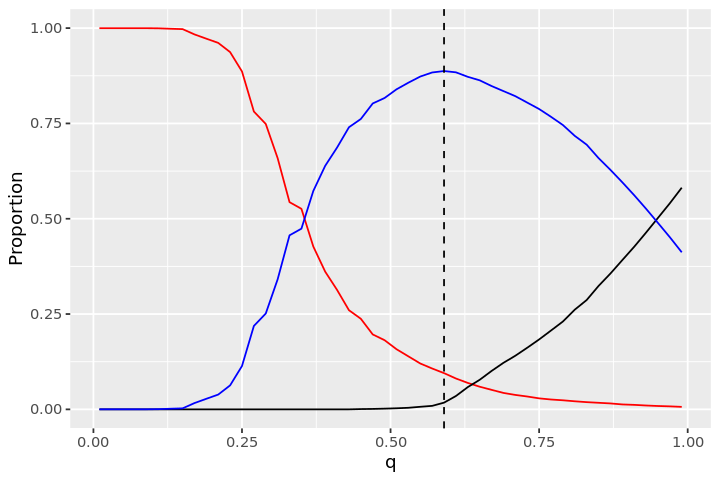

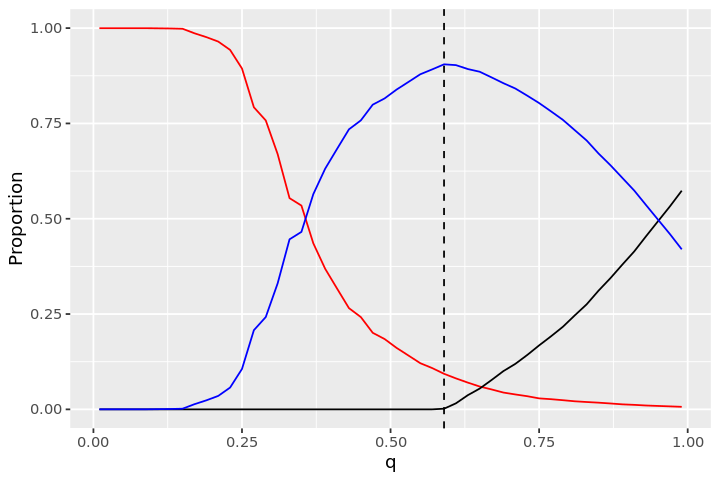

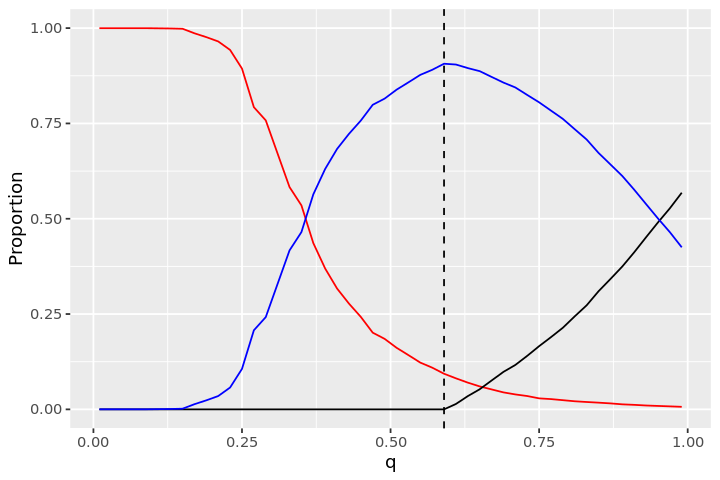

In [12]:
## Finalize round 1 classifications, remove negative cells
round.calls <- classifyCells(bar.table, q=findQ(threshold.results$res, threshold.results$extrema))
neg.cells <- names(round.calls)[which(round.calls == "Negative")]
bar.table <- bar.table[-which(rownames(bar.table) %in% neg.cells), ]

options(repr.plot.width=6, repr.plot.height=4)
while (length(names(round.calls)[which(round.calls == "Negative")]) > 0) {
    
    i <- i+1
    bar.table_sweep.list <- list()
    n <- 0
    for (q in seq(0.01, 0.99, by=0.02)) {
      #print(q)
      n <- n + 1
      bar.table_sweep.list[[n]] <- classifyCells(bar.table, q=q)
      names(bar.table_sweep.list)[n] <- paste("q=",q,sep="")
    }
    
    error1 <- FALSE
    tryCatch(threshold.results <- findThresh(call.list=bar.table_sweep.list),
             error = function(e) { error1 <<- TRUE}
            )
    if (error1==TRUE) {
        break
    }

    threshold.results <- findThresh(call.list=bar.table_sweep.list)
    p <- ggplot(data=threshold.results$res, aes(x=q, y=Proportion, color=Subset)) + geom_line() + theme(legend.position = "none") +
      geom_vline(xintercept=threshold.results$extrema, lty=2) + scale_color_manual(values=c("red","black","blue"))
    print(p)
    round.calls <- classifyCells(bar.table, q=findQ(threshold.results$res, threshold.results$extrema))
    neg.cells <- c(neg.cells, names(round.calls)[which(round.calls == "Negative")])
    bar.table <- bar.table[-which(rownames(bar.table) %in% neg.cells), ]
    
}

In [13]:
final.calls <- c(round.calls, rep("Negative",length(neg.cells)))
names(final.calls) <- c(names(round.calls),neg.cells)

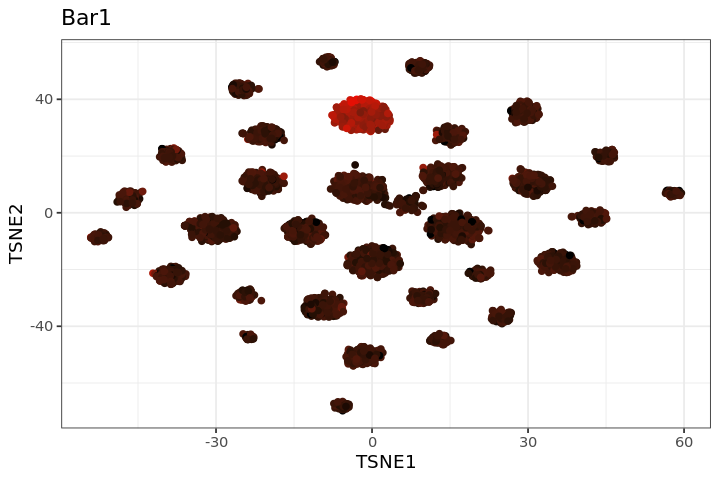

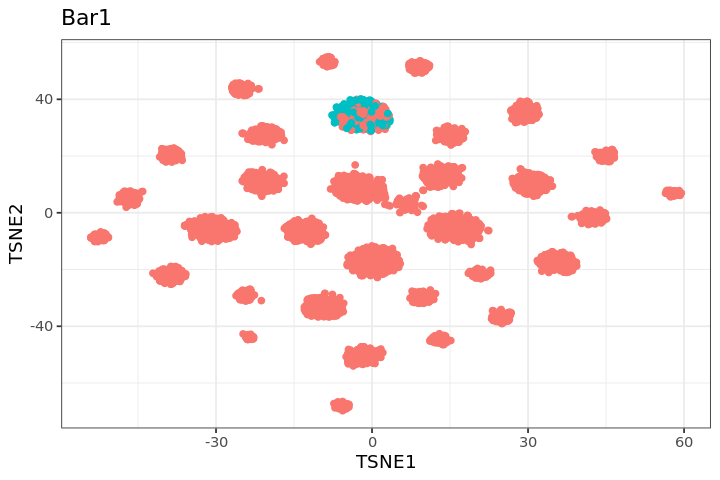

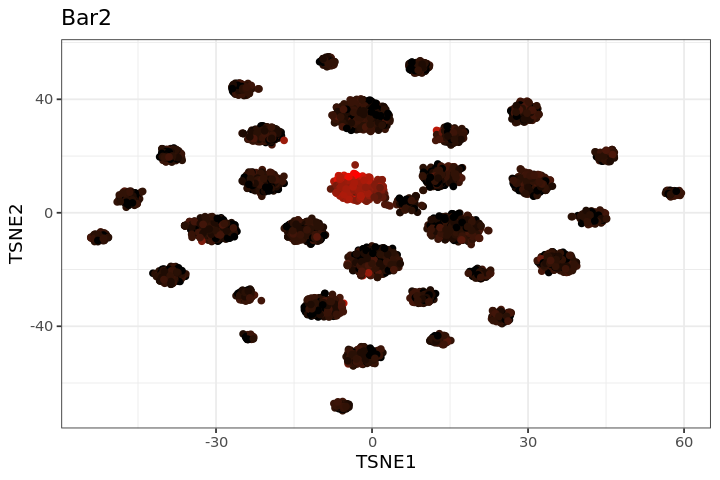

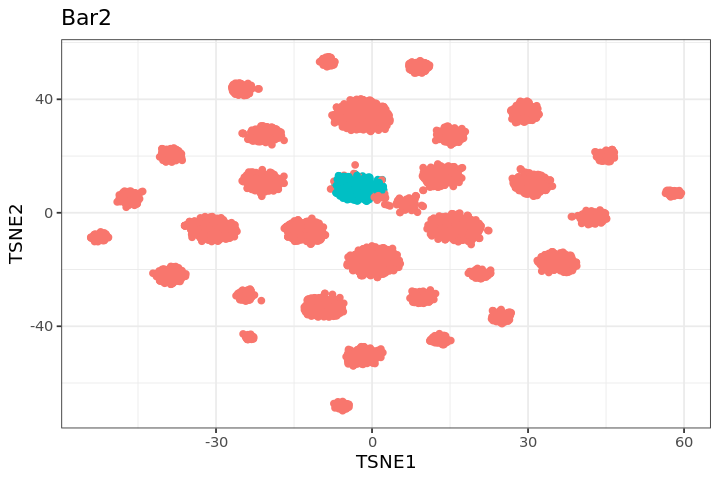

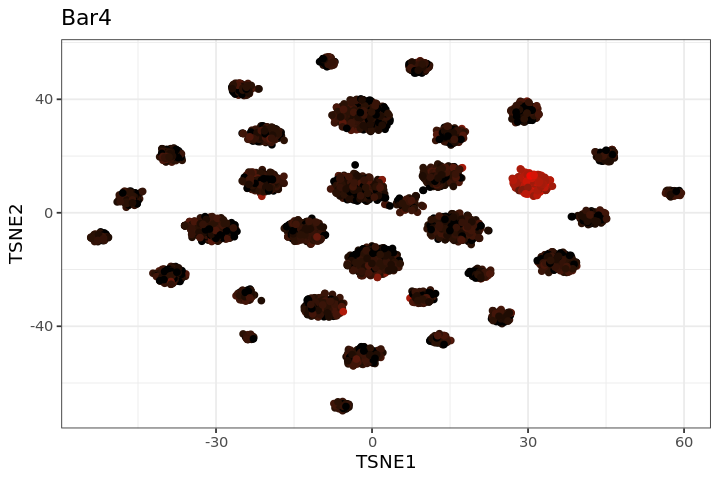

...

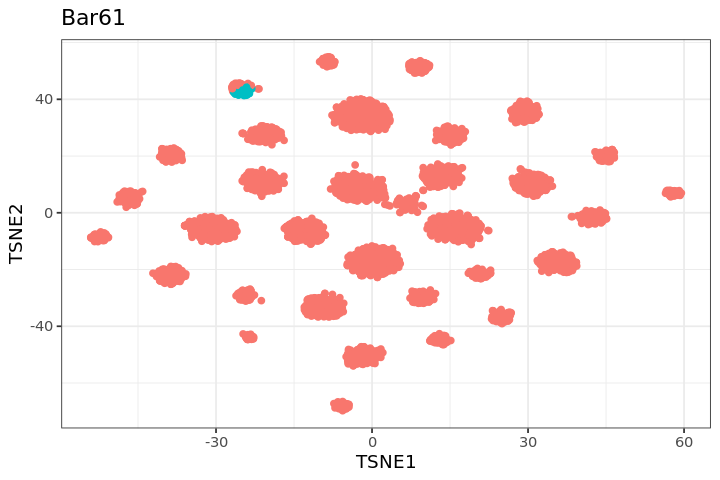

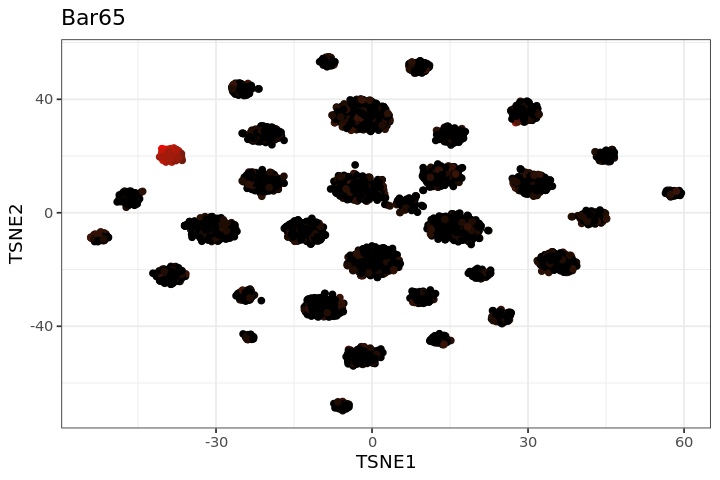

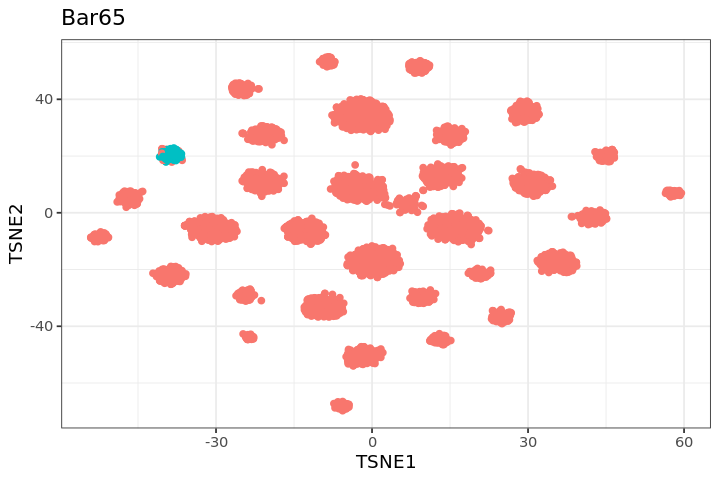

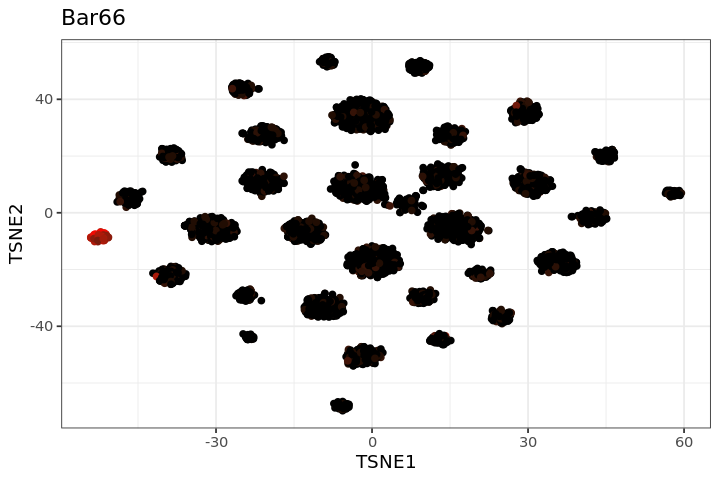

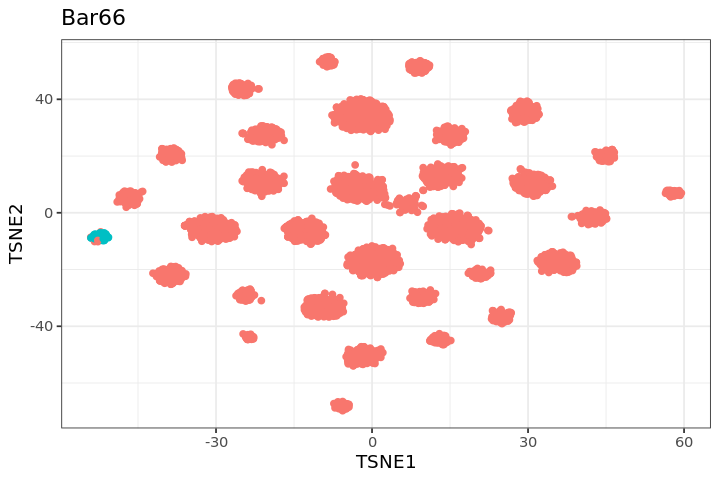

In [14]:
bar.tsne$MULTI_class_new <- final.calls[rownames(bar.tsne)]
for (i in 3:(ncol(bar.tsne)-2)) {
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = bar.tsne[,i])) +
        geom_point() +
        scale_color_gradient(low = "black", high = "red") +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = MULTI_class_new == colnames(bar.tsne)[i])) +
        geom_point() +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
}

Warning message:
“Transformation introduced infinite values in discrete y-axis”
Warning message:
“Transformation introduced infinite values in discrete y-axis”


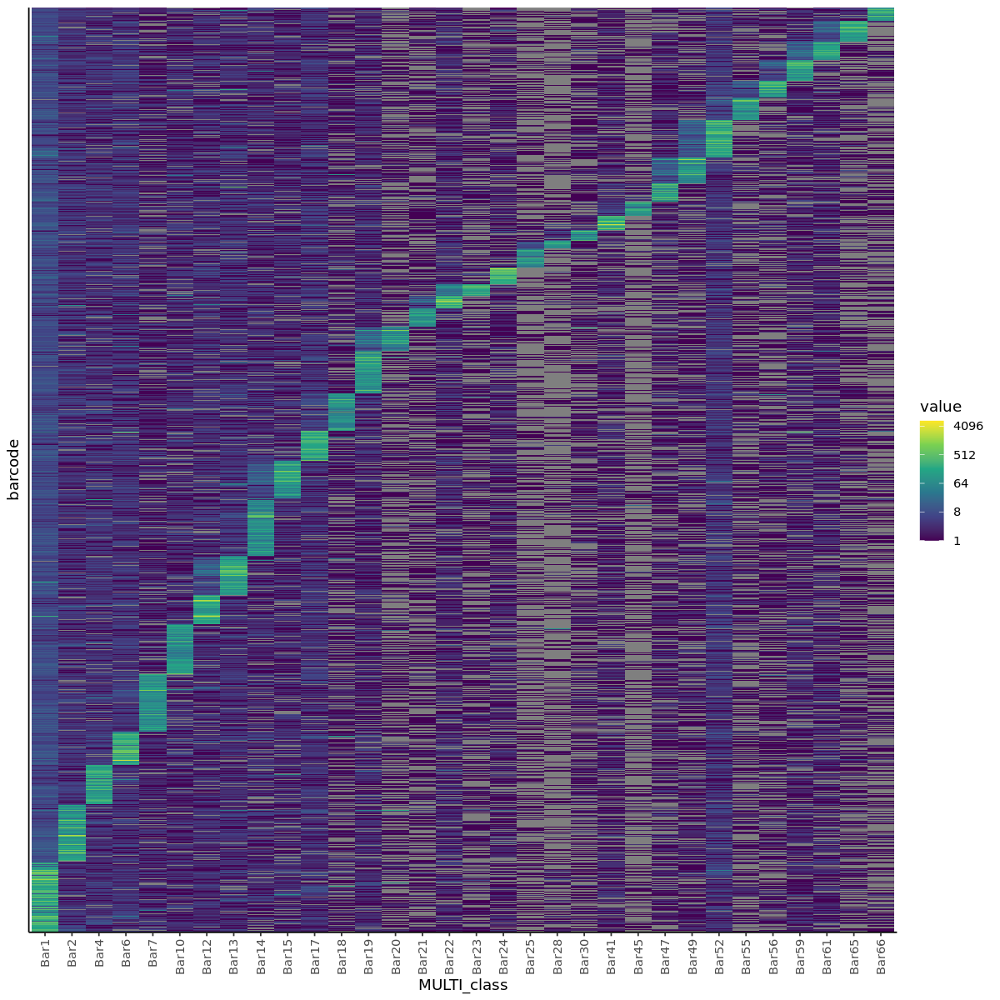

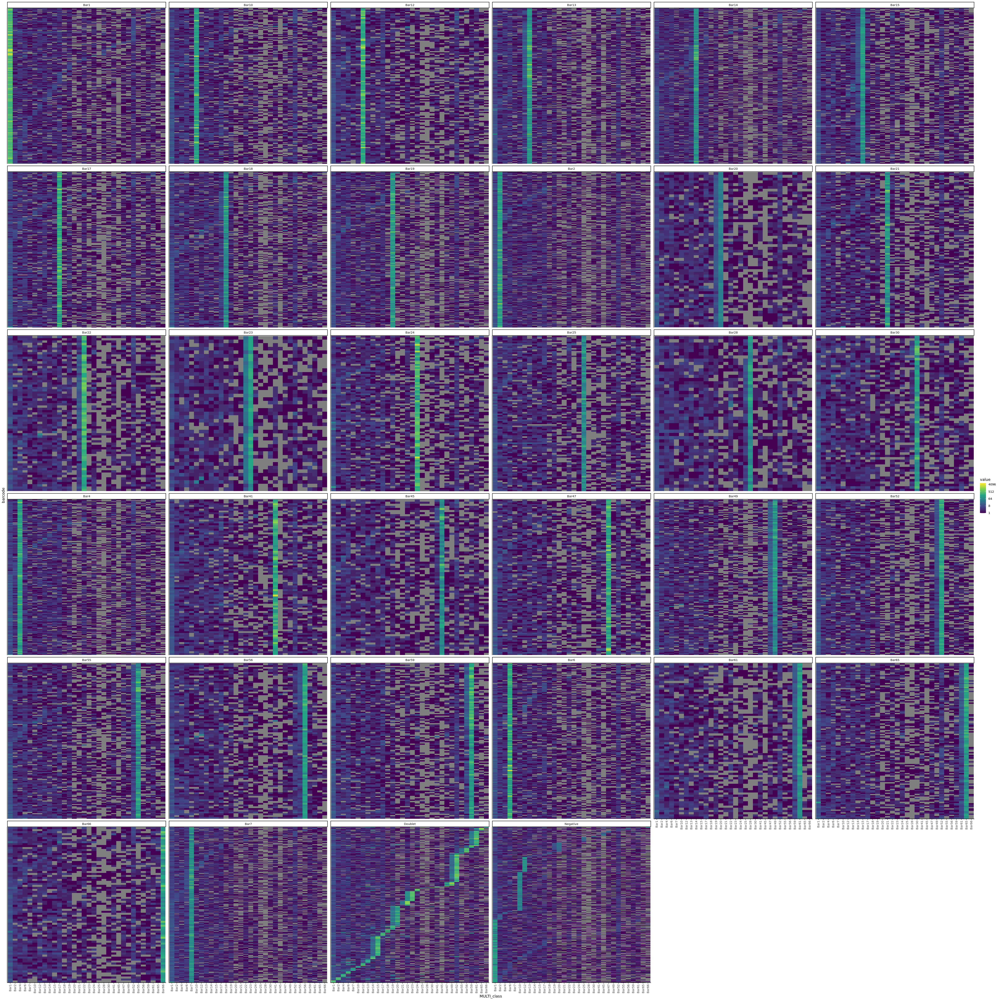

In [15]:
bar.table.hm <- bar.table.full[names(final.calls),good.bars]
bar.table.hm <- data.table(bar.table.hm)
rownames(bar.table.hm) <- names(final.calls)

argmax <- max.col(bar.table.hm)
bar.table.hm.sorted <- bar.table.hm[sort(argmax, index.return=TRUE)$ix,]
rownames(bar.table.hm.sorted) <- rownames(bar.table.hm)[sort(argmax, index.return=TRUE)$ix]
argmax2 <- max.col(replace(as.matrix(bar.table.hm.sorted), cbind(1:dim(bar.table.hm.sorted)[1], max.col(as.matrix(bar.table.hm.sorted))), -Inf))

sorted_argmax <- max.col(bar.table.hm.sorted)
rns <- rownames(bar.table.hm.sorted)
for (i in unique(argmax)) {
    bar.table.hm.sorted[sorted_argmax==i,] = bar.table.hm.sorted[sorted_argmax==i,][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix,]
    
    rns[sorted_argmax==i] <- rns[sorted_argmax==i][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix]
}
bar.table.hm.sorted <- as.matrix(bar.table.hm.sorted)
rownames(bar.table.hm.sorted) <- rns

to.plot <- melt(bar.table.hm.sorted, varnames = c("barcode", "MULTI_class"))
to.plot$final_call <- unname(final.calls[as.character(to.plot$barcode)])

options(repr.plot.width=10, repr.plot.height=10)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

options(repr.plot.width=40, repr.plot.height=40)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  facet_wrap(~final_call, scales = "free_y")
print(p)

In [16]:
table(final.calls)

final.calls
    Bar1    Bar10    Bar12    Bar13    Bar14    Bar15    Bar17    Bar18 
     207      167      120      228      343      174      176      222 
   Bar19     Bar2    Bar20    Bar21    Bar22    Bar23    Bar24    Bar25 
     251      323       56      113       67       43       94      102 
   Bar28    Bar30     Bar4    Bar41    Bar45    Bar47    Bar49    Bar52 
      48       64      229       85       75      106      152      137 
   Bar55    Bar56    Bar59     Bar6    Bar61    Bar65    Bar66     Bar7 
     136       88      122      195       71      119       78      355 
 Doublet Negative 
     489      570 

In [17]:
good.bars[!(good.bars %in% unique(final.calls))]

character(0)

[1] "Normalizing barode data..."
[1] "Pre-allocating data structures..."
[1] "Determining classifications for negative cells across all BCs, all q..."
[1] "Computing classification stability..."
[1] "Extracting rescued classifications..."
[1] "Normalizing barode data..."
[1] "Pre-allocating data structures..."
[1] "Determining classifications for negative cells across all BCs, all q..."
[1] "Computing classification stability..."
[1] "Extracting rescued classifications..."
[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[1] 35
[1] 36
[1] 37
[1] 38
[1] 39
[1] 40
[1] 41
[1] 42
[1] 43
[1] 1
[1] 2
[1] 3
[1] 4
[1] 5
[1] 6
[1] 7
[1] 8
[1] 9
[1] 10
[1] 11
[1] 12
[1] 13
[1] 14
[1] 15
[1] 16
[1] 17
[1] 18
[1] 19
[1] 20
[1] 21
[1] 22
[1] 23
[1] 24
[1] 25
[1] 26
[1] 27
[1] 28
[1] 29
[1] 30
[1] 31
[1] 32
[1] 33
[1] 34
[

Warning message:
“Removed 1 rows containing missing values (geom_point).”


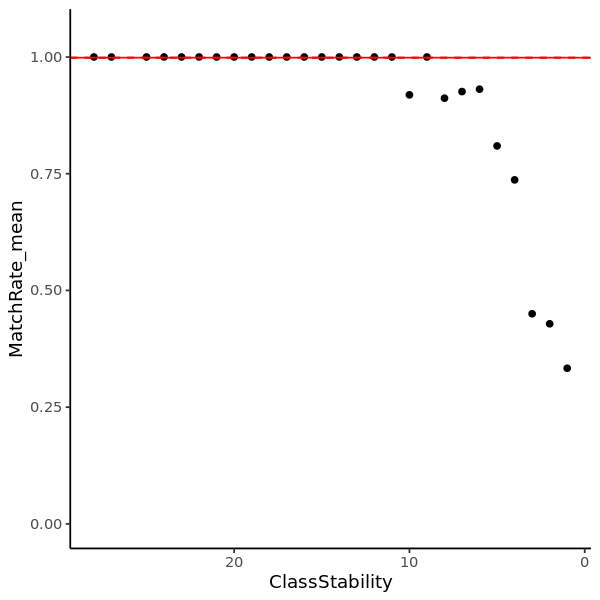

In [18]:
options(repr.plot.width=5, repr.plot.height=5)
## Perform semi-supervised negative cell reclassification
if (!error1) {
    
    error2 <- FALSE
    tryCatch(reclass.cells <- findReclassCells(bar.table.full[,good.bars], names(final.calls)[which(final.calls=="Negative")]),
             error = function(e) { error2 <<- TRUE}
            )
    
    if (!error2) {
    
        reclass.cells <- findReclassCells(bar.table.full[,good.bars], names(final.calls)[which(final.calls=="Negative")])
        error3 <- FALSE
        tryCatch(reclass.res <- rescueCells(bar.table.full[,good.bars], final.calls, reclass.cells),
                 error = function(e) { error3 <<- TRUE}
                )
        if (!error3) {

            reclass.res <- rescueCells(bar.table.full[,good.bars], final.calls, reclass.cells)

            ## Visualize Results
            p <- ggplot(reclass.res[-1, ], aes(x=ClassStability, y=MatchRate_mean)) + 
                geom_point() + xlim(c(nrow(reclass.res)-1,1)) + 
                ylim(c(0,1.05)) +
                geom_errorbar(aes(ymin=MatchRate_mean-MatchRate_sd, ymax=MatchRate_mean+MatchRate_sd), width=.1) +
                geom_hline(yintercept = reclass.res$MatchRate_mean[1], color="red") +
                geom_hline(yintercept = reclass.res$MatchRate_mean[1]+3*reclass.res$MatchRate_sd[1], color="red",lty=2) +
                geom_hline(yintercept = reclass.res$MatchRate_mean[1]-3*reclass.res$MatchRate_sd[1], color="red",lty=2) +
                theme_classic()
            print(p)

            ## Finalize negative cell rescue results
            final.calls.rescued <- final.calls
            #rescue.ind <- which(reclass.cells$ClassStability >= io$reclass_stability[[opts$experiment]][[opts$sample]]) ## Note: Value will be dataset-specific
            rescue.ind <- which(reclass.cells$ClassStability >= 4) ## Note: Value will be dataset-specific # previously: 8 which was pretty reasonable and only 183 negative cells left
            final.calls.rescued[rownames(reclass.cells)[rescue.ind]] <- reclass.cells$Reclassification[rescue.ind]

        }
    }
}

In [19]:
table(final.calls)

final.calls
    Bar1    Bar10    Bar12    Bar13    Bar14    Bar15    Bar17    Bar18 
     207      167      120      228      343      174      176      222 
   Bar19     Bar2    Bar20    Bar21    Bar22    Bar23    Bar24    Bar25 
     251      323       56      113       67       43       94      102 
   Bar28    Bar30     Bar4    Bar41    Bar45    Bar47    Bar49    Bar52 
      48       64      229       85       75      106      152      137 
   Bar55    Bar56    Bar59     Bar6    Bar61    Bar65    Bar66     Bar7 
     136       88      122      195       71      119       78      355 
 Doublet Negative 
     489      570 

In [20]:
table(final.calls.rescued)

final.calls.rescued
    Bar1    Bar10    Bar12    Bar13    Bar14    Bar15    Bar17    Bar18 
     378      304      174      230      353      178      178      233 
   Bar19     Bar2    Bar20    Bar21    Bar22    Bar23    Bar24    Bar25 
     252      337       82      115       67       43       94      122 
   Bar28    Bar30     Bar4    Bar41    Bar45    Bar47    Bar49    Bar52 
      48       67      234       86       84      110      155      137 
   Bar55    Bar56    Bar59     Bar6    Bar61    Bar65    Bar66     Bar7 
     139       92      122      196       71      119       81      360 
 Doublet Negative 
     489       75 

In [21]:
table(readRDS('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/MULTI/exp6_d4.5_d5/sampleA_finalCalls.rds'))


    Bar1    Bar10    Bar12    Bar13    Bar14    Bar15    Bar17    Bar18 
     378      304      174      230      353      178      178      233 
   Bar19     Bar2    Bar20    Bar21    Bar22    Bar23    Bar24    Bar25 
     252      337       82      115       67       43       94      122 
   Bar28    Bar30     Bar4    Bar41    Bar45    Bar47    Bar49    Bar52 
      48       67      234       86       84      110      155      137 
   Bar55    Bar56    Bar59     Bar6    Bar61    Bar65    Bar66     Bar7 
     139       92      122      196       71      119       81      360 
 Doublet Negative 
     489       75 

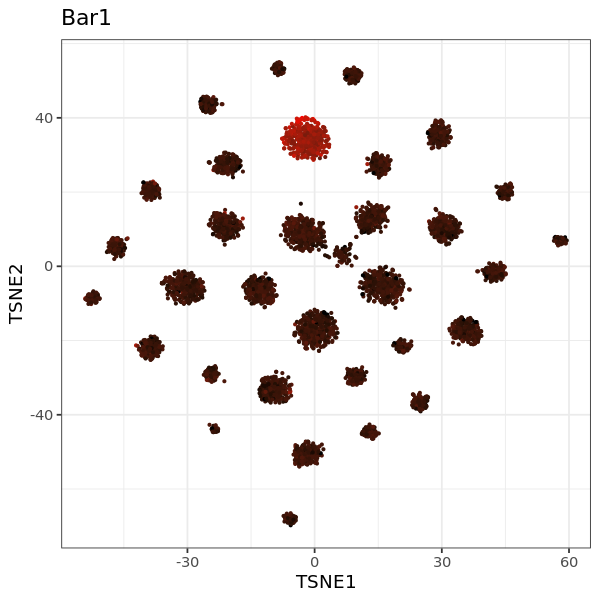

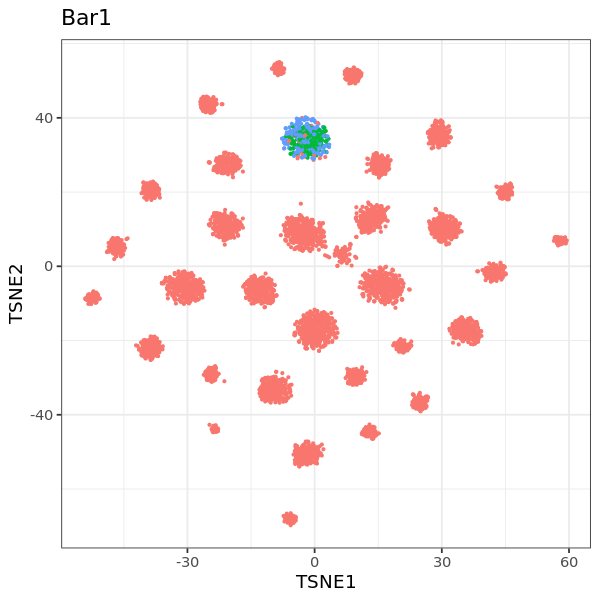

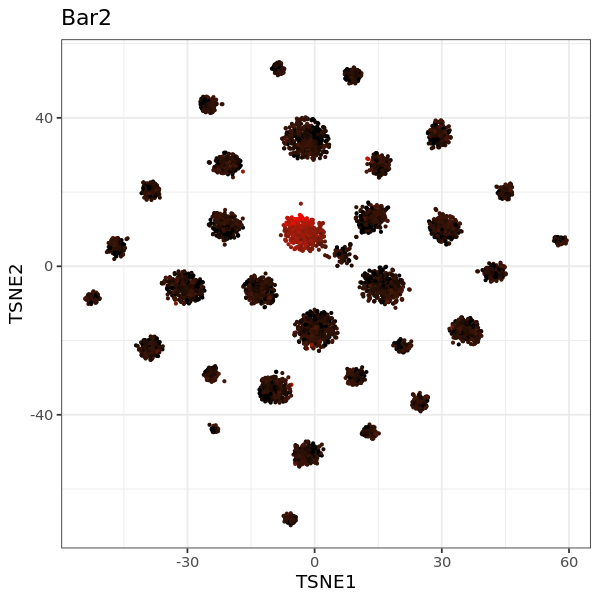

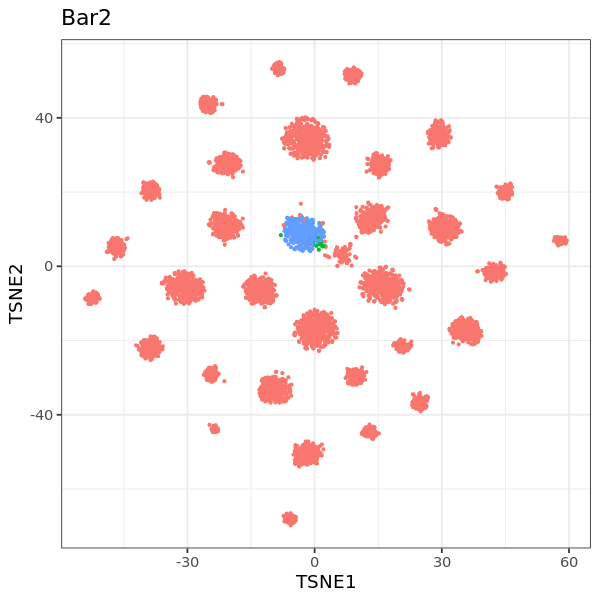

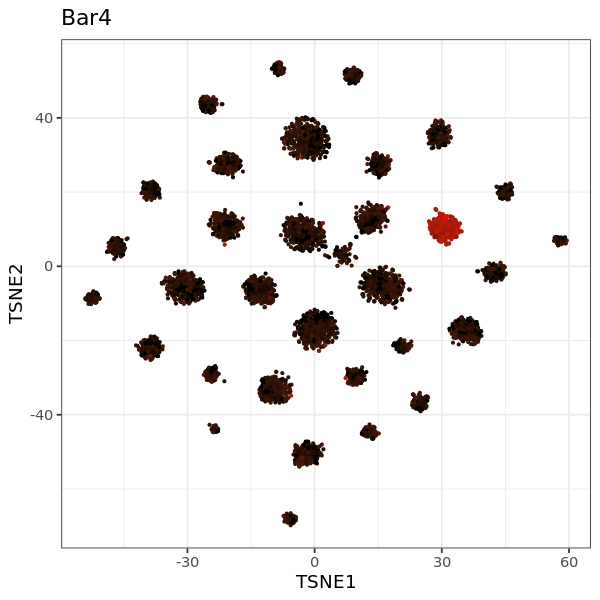

...

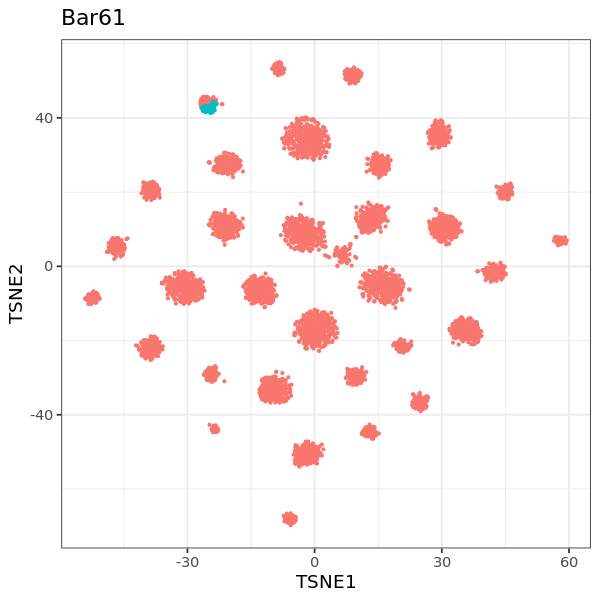

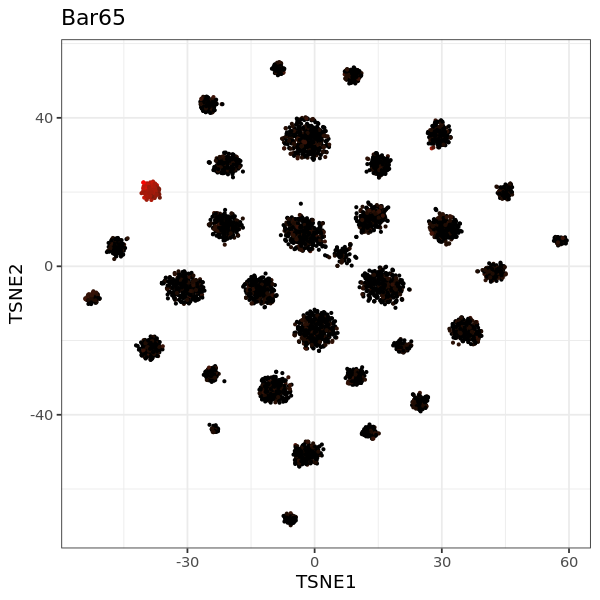

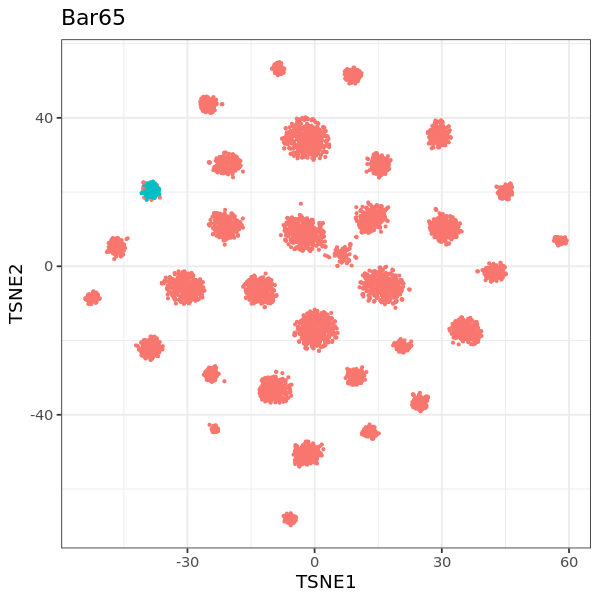

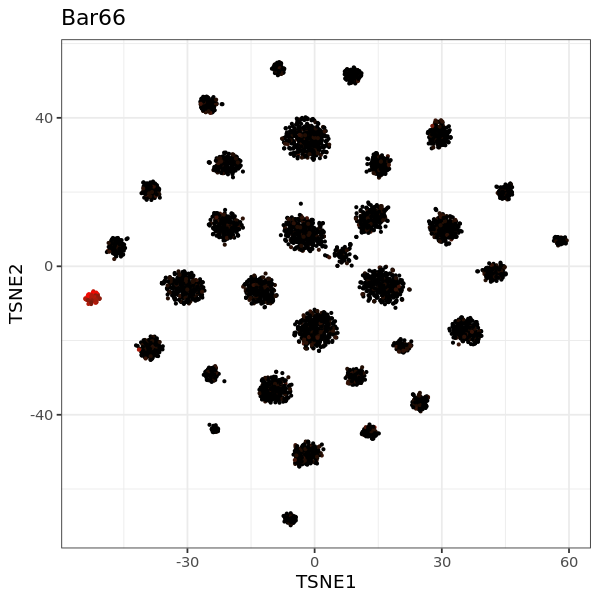

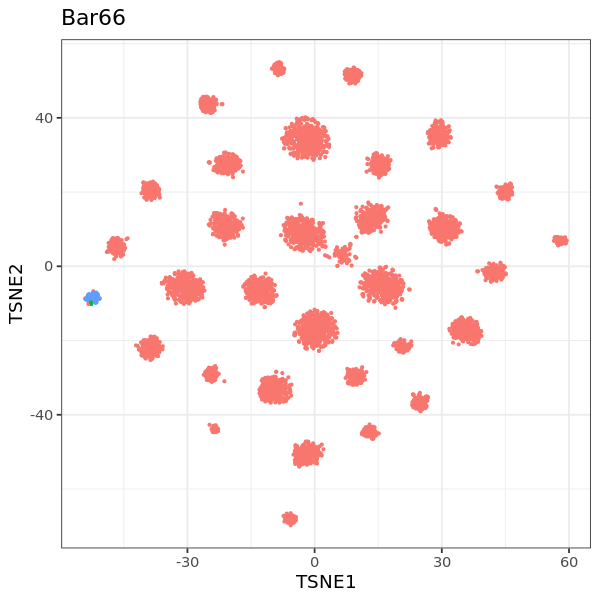

In [22]:
options(repr.plot.width=5, repr.plot.height=5)
bar.tsne$MULTI_class_rescued <- final.calls.rescued[rownames(bar.tsne)]
for (i in 3:(ncol(bar.tsne)-3)) {
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = bar.tsne[,i])) +
        geom_point(size=0.5) +
        scale_color_gradient(low = "black", high = "red") +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = as.character((MULTI_class_new == colnames(bar.tsne)[i]) + (MULTI_class_rescued == colnames(bar.tsne)[i])))) +
        geom_point(size=0.5) +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
}

Bar15, Bar20, Bar52, and Bar61 still low.

`summarise()` has grouped output by 'MULTI_class'. You can override using the `.groups` argument.

`summarise()` has grouped output by 'MULTI_class'. You can override using the `.groups` argument.



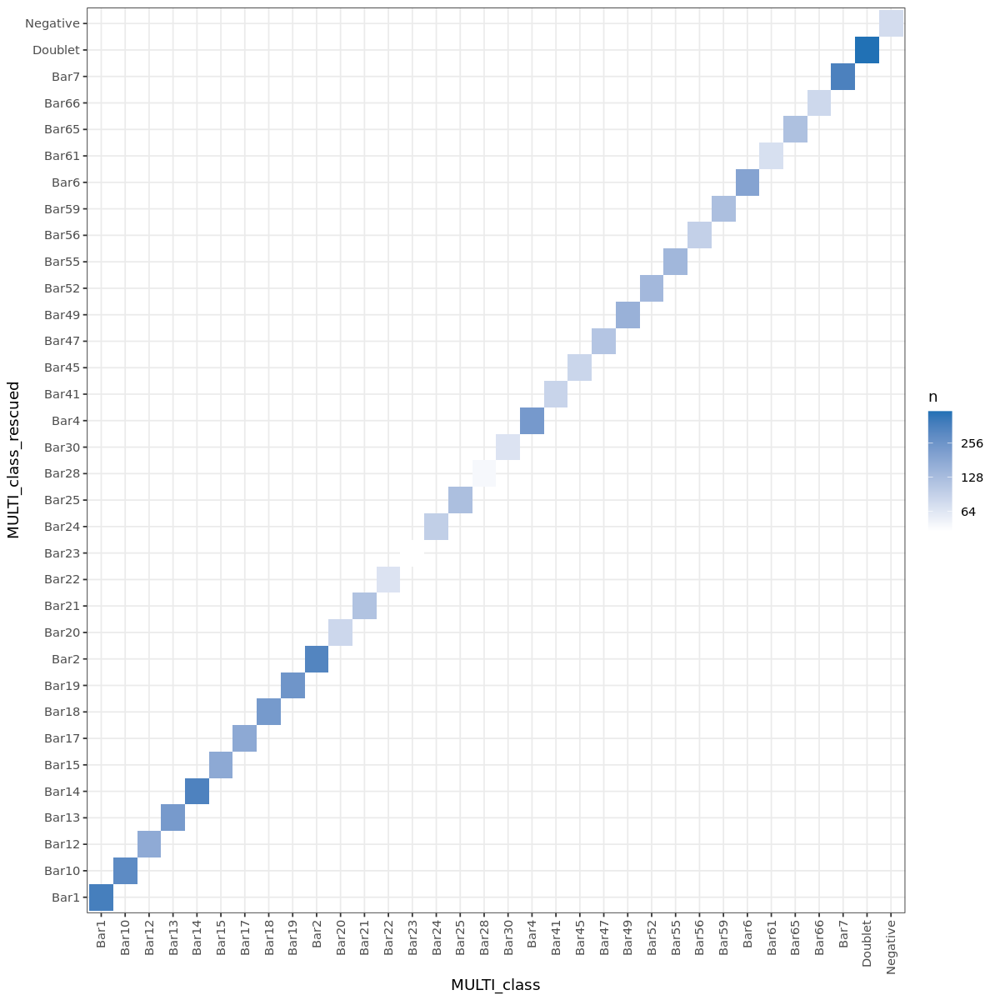

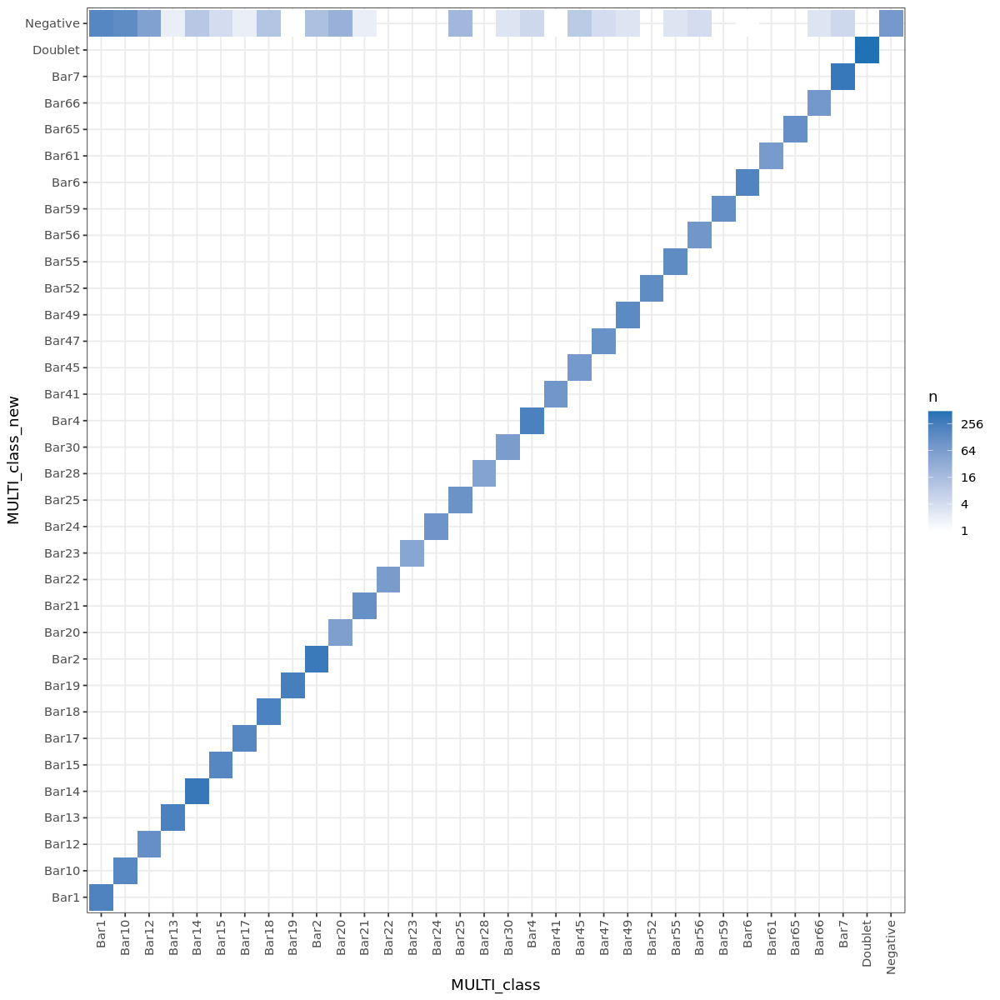

In [23]:
options(repr.plot.width=10, repr.plot.height=10)
to.plot <- bar.tsne %>%
    group_by(MULTI_class, MULTI_class_rescued) %>%
    summarise(n=n())
p <- ggplot(to.plot, aes(MULTI_class, MULTI_class_rescued, fill= n)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  scale_fill_gradient(low="white", high="#2171b5", trans = 'log2') +
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

to.plot <- bar.tsne %>%
    group_by(MULTI_class, MULTI_class_new) %>%
    summarise(n=n())
p <- ggplot(to.plot, aes(MULTI_class, MULTI_class_new, fill= n)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  scale_fill_gradient(low="white", high="#2171b5", trans = 'log2') +
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_bw() +
    theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

Warning message:
“Transformation introduced infinite values in discrete y-axis”
Warning message:
“Transformation introduced infinite values in discrete y-axis”


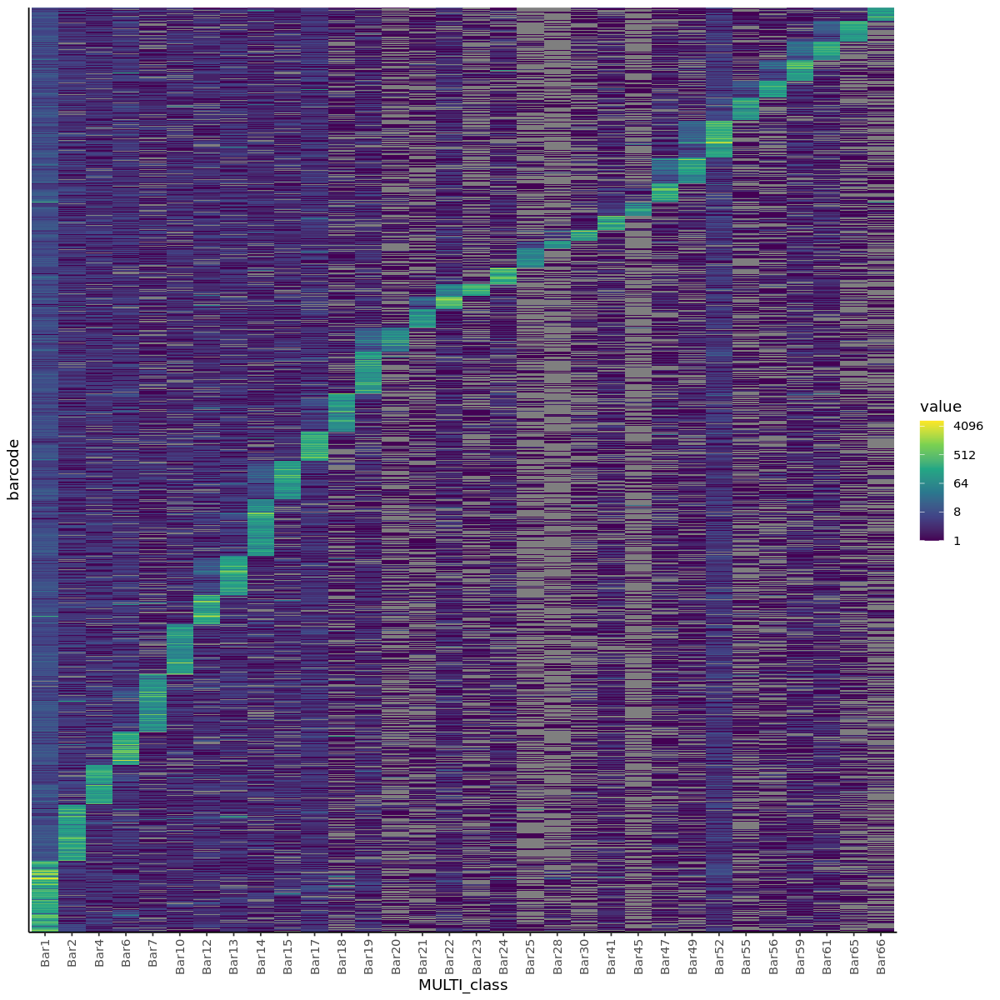

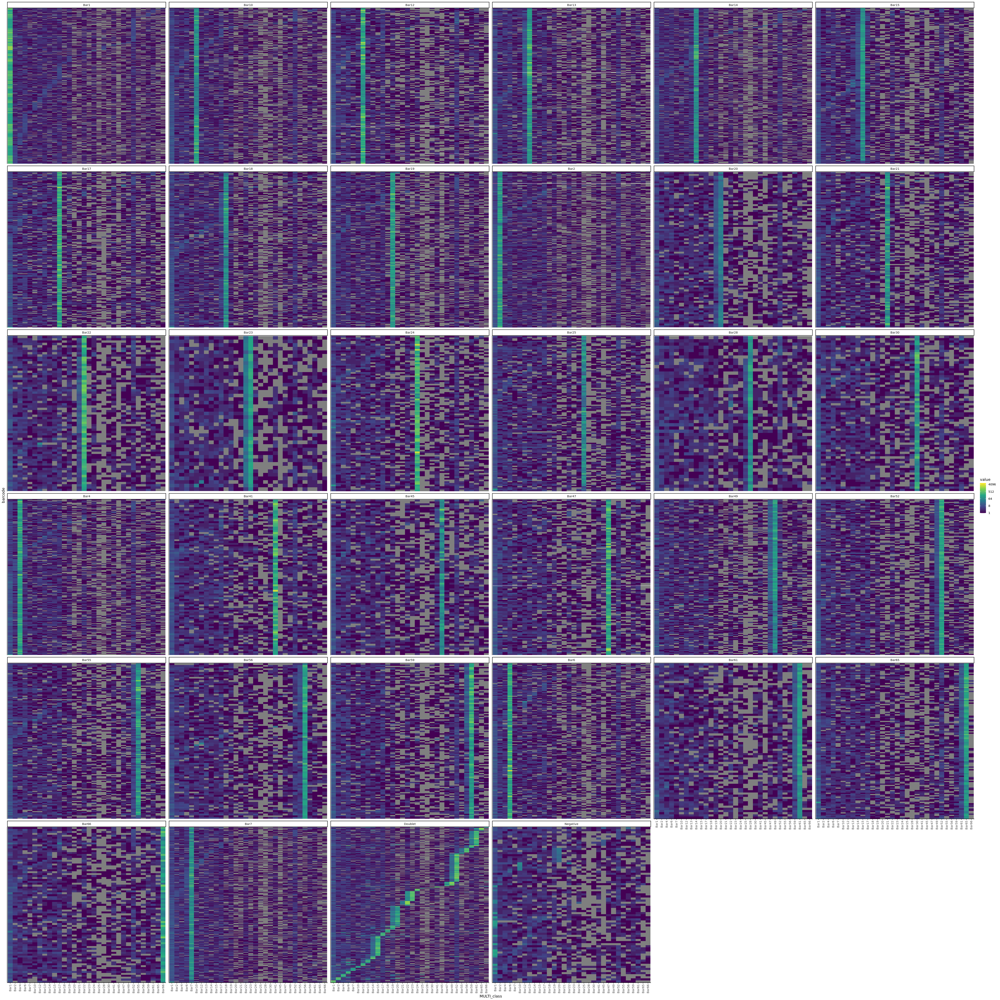

In [24]:
bar.table.hm <- bar.table.full[names(final.calls.rescued),good.bars]
bar.table.hm <- data.table(bar.table.hm)
rownames(bar.table.hm) <- names(final.calls.rescued)

argmax <- max.col(bar.table.hm)
bar.table.hm.sorted <- bar.table.hm[sort(argmax, index.return=TRUE)$ix,]
rownames(bar.table.hm.sorted) <- rownames(bar.table.hm)[sort(argmax, index.return=TRUE)$ix]
argmax2 <- max.col(replace(as.matrix(bar.table.hm.sorted), cbind(1:dim(bar.table.hm.sorted)[1], max.col(as.matrix(bar.table.hm.sorted))), -Inf))

sorted_argmax <- max.col(bar.table.hm.sorted)
rns <- rownames(bar.table.hm.sorted)
for (i in unique(argmax)) {
    bar.table.hm.sorted[sorted_argmax==i,] = bar.table.hm.sorted[sorted_argmax==i,][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix,]
    
    rns[sorted_argmax==i] <- rns[sorted_argmax==i][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix]
}
bar.table.hm.sorted <- as.matrix(bar.table.hm.sorted)
rownames(bar.table.hm.sorted) <- rns

to.plot <- melt(bar.table.hm.sorted, varnames = c("barcode", "MULTI_class"))
to.plot$final_call <- unname(final.calls.rescued[as.character(to.plot$barcode)])

options(repr.plot.width=10, repr.plot.height=10)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

options(repr.plot.width=40, repr.plot.height=40)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  facet_wrap(~final_call, scales = "free_y")
print(p)

In [25]:
suppressPackageStartupMessages(library(data.table))
suppressPackageStartupMessages(library(ggplot2))
suppressPackageStartupMessages(library(dplyr))
suppressPackageStartupMessages(library(ggalluvial))
suppressPackageStartupMessages(library(ggrepel))
library(gtools)
library(ggsignif)
source("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/plotting_settings.R")

In [26]:
g_meta <- fread('/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/plot_df_joined.txt.gz')
g_meta[MULTI_class %in% as.vector(unlist(neural)), gastr_type := "neural"]
g_meta[MULTI_class %in% as.vector(unlist(meso)), gastr_type := "meso"]
g_meta[MULTI_class %in% as.vector(unlist(intermediate)), gastr_type := "intermediate"]

g_meta <- g_meta[batch == 'exp6_d4.5_d5_sampleA']

ERROR: Error in fread("/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/plot_df_joined.txt.gz"): File '/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/data_dir/processed_files_Leah/scRNAseq/plot_df_joined.txt.gz' does not exist or is non-readable. getwd()=='/nfs/research/marioni/Leah/gastrulation_epigenetics/gastruloid_characterisation/gastruloids_scRNAseq/pipeline/processing/check_MULTIseq_assignment'


In [ ]:
MULTI_class1 <- final.calls
names(MULTI_class1) <- paste0(names(MULTI_class1), '-1')

#MULTI_class2 <- final.calls2
#names(MULTI_class2) <- paste0(names(MULTI_class2), '-1')

MULTI_class3 <- final.calls.rescued
names(MULTI_class3) <- paste0(names(MULTI_class3), '-1')

g_meta$MULTI_class1 <- unname(MULTI_class1[g_meta$barcode])
#g_meta$MULTI_class2 <- unname(MULTI_class2[g_meta$barcode])
g_meta$MULTI_class3 <- unname(MULTI_class3[g_meta$barcode])

g_meta[paste0(MULTI_class3, '_exp6_d4.5_d5') %in% as.vector(unlist(neural)), gastr_type3 := "neural"]
g_meta[paste0(MULTI_class3, '_exp6_d4.5_d5') %in% as.vector(unlist(meso)), gastr_type3 := "meso"]
g_meta[paste0(MULTI_class3, '_exp6_d4.5_d5') %in% as.vector(unlist(intermediate)), gastr_type3 := "intermediate"]
g_meta[MULTI_class3 %in% c("Negative", "Doublet"), gastr_type3 := MULTI_class3]
#g_meta[MULTI_class3 == 'Bar18', gastr_type3 := "meso"]

In [ ]:
gastr_order_long <- c( "Bar65_exp6_d4.5_d5", "Bar28_exp6_d4.5_d5", "Bar45_exp6_d4.5_d5", "Bar23_exp6_d4.5_d5", "Bar55_exp6_d4.5_d5", "Bar25_exp6_d4.5_d5", "Bar56_exp6_d4.5_d5", "Bar66_exp6_d4.5_d5",
                 "Bar61_exp6_d4.5_d5", "Bar49_exp6_d4.5_d5", "Bar41_exp6_d4.5_d5", "Bar52_exp6_d4.5_d5", "Bar47_exp6_d4.5_d5", "Bar24_exp6_d4.5_d5", "Bar59_exp6_d4.5_d5", "Bar30_exp6_d4.5_d5",
                 "Bar7_exp6_d4.5_d5", "Bar2_exp6_d4.5_d5", "Bar21_exp6_d4.5_d5", "Bar10_exp6_d4.5_d5", "Bar19_exp6_d4.5_d5", "Bar14_exp6_d4.5_d5", "Bar22_exp6_d4.5_d5", "Bar12_exp6_d4.5_d5" ,
                 "Bar1_exp6_d4.5_d5", "Bar13_exp6_d4.5_d5", "Bar15_exp6_d4.5_d5", "Bar18_exp6_d4.5_d5", "Bar4_exp6_d4.5_d5", "Bar6_exp6_d4.5_d5", "Bar20_exp6_d4.5_d5", "Bar17_exp6_d4.5_d5" 
)

options(repr.plot.width=25, repr.plot.height=12)
to.plot <- g_meta[,.N,by=c("cluster","MULTI_class")]
to.plot$MULTI_class = factor(to.plot$MULTI_class, levels=gastr_order_long)
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- barplot.pub(to.plot[!is.na(cluster)], x="cluster", colors=cluster_colours) +
  facet_wrap(~MULTI_class, nrow=2, scales="free_x")
print(p)

In [ ]:
gastr_order_short <- c( "Bar65", "Bar28", "Bar45", "Bar23", "Bar55", "Bar25", "Bar56", "Bar66",
                 "Bar61", "Bar49", "Bar41", "Bar52", "Bar47", "Bar24", "Bar59", "Bar30",
                 "Bar7", "Bar2", "Bar21", "Bar10", "Bar19", "Bar14", "Bar22", "Bar12" ,
                 "Bar1", "Bar13", "Bar15", "Bar18", "Bar4", "Bar6", "Bar20", "Bar17" 
)

options(repr.plot.width=25, repr.plot.height=12)
to.plot <- g_meta[,.N,by=c("cluster","MULTI_class1")]
to.plot$MULTI_class1 = factor(to.plot$MULTI_class1, levels=gastr_order_short)
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- barplot.pub(to.plot[!is.na(cluster)], x="cluster", colors=cluster_colours) +
  facet_wrap(~MULTI_class1, nrow=2, scales="free_x")
print(p)

#to.plot <- g_meta[,.N,by=c("cluster","MULTI_class2")]
#to.plot$MULTI_class2 = factor(to.plot$MULTI_class2, levels=gastr_order_short)
#to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
#p <- barplot.pub(to.plot[!is.na(cluster)], x="cluster", colors=cluster_colours) +
#  facet_wrap(~MULTI_class2, nrow=2, scales="free_x") +
#  ggtitle('d3')
#print(p)

to.plot <- g_meta[,.N,by=c("cluster","MULTI_class3")]
to.plot$MULTI_class3 = factor(to.plot$MULTI_class3, levels=gastr_order_short)
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- barplot.pub(to.plot[!is.na(cluster)], x="cluster", colors=cluster_colours) +
  facet_wrap(~MULTI_class3, nrow=2, scales="free_x")
print(p)

In [ ]:
g_meta[!(MULTI_class %in% c('Doublet', 'Negative')),MULTI_agree := MULTI_class == paste0(MULTI_class3, '_exp6_d4.5_d5')]
g_meta[(MULTI_class %in% c('Doublet', 'Negative')),MULTI_agree := MULTI_class == MULTI_class3]

In [ ]:
to.plot <- g_meta[,.N,by=c("cluster", "MULTI_class3", "MULTI_agree")]
to.plot$MULTI_class3 = factor(to.plot$MULTI_class3, levels=gastr_order_short)
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- ggplot(to.plot, aes(x = cluster, y = N)) + scale_x_discrete(drop = FALSE) + 
    labs(y = "Number of cells") +
    theme_classic() +
    theme(strip.background = element_blank(),
          strip.text = element_text(color = "black", size = rel(1.3)),
          axis.title.x = element_text(color = "black", size = rel(1.1)),
          axis.title.y = element_blank(), 
          axis.text.y = element_text(size = rel(1.3), color = "black"), 
          axis.text.x = element_text(size = rel(1.1), color = "black")) +
    geom_bar(stat = "identity", aes(fill = MULTI_agree)) +
    coord_flip() +
    facet_wrap(~MULTI_class3, nrow=2, scales="free_x")
print(p)
p <- ggplot(to.plot, aes(x = cluster, y = N)) + scale_x_discrete(drop = FALSE) + 
    labs(y = "Number of cells") +
    theme_classic() +
    theme(strip.background = element_blank(),
          strip.text = element_text(color = "black", size = rel(1.3)),
          axis.title.x = element_text(color = "black", size = rel(1.1)),
          axis.title.y = element_blank(), 
          axis.text.y = element_text(size = rel(1.3), color = "black"), 
          axis.text.x = element_text(size = rel(1.1), color = "black")) +
    geom_bar(stat = "identity", position="fill", aes(fill = MULTI_agree)) +
    coord_flip() +
    facet_wrap(~MULTI_class3, nrow=2, scales="free_x")
print(p)

to.plot <- g_meta[, sum := .N, by = c("MULTI_class3", "cluster", "gastr_type3")][, prop := .N, by = c("MULTI_class3", "cluster", "MULTI_agree", "gastr_type3")][, prop := prop/sum][, sum := NULL][,cell := NULL] %>% unique
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- ggplot(to.plot, aes(x=cluster, y=prop, fill=gastr_type3)) +
  geom_boxplot() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  #scale_y_continuous(trans='log2') +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

In [ ]:
g_meta[,.N,by=c("MULTI_agree", "MULTI_class3", "gastr_type3")]

In [ ]:
to.plot <- g_meta[,.N,by=c("cluster", "MULTI_class", "MULTI_agree")]
to.plot$MULTI_class = factor(to.plot$MULTI_class, levels=gastr_order_long)
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- ggplot(to.plot, aes(x = cluster, y = N)) + scale_x_discrete(drop = FALSE) + 
    labs(y = "Number of cells") +
    theme_classic() +
    theme(strip.background = element_blank(),
          strip.text = element_text(color = "black", size = rel(1.3)),
          axis.title.x = element_text(color = "black", size = rel(1.1)),
          axis.title.y = element_blank(), 
          axis.text.y = element_text(size = rel(1.3), color = "black"), 
          axis.text.x = element_text(size = rel(1.1), color = "black")) +
    geom_bar(stat = "identity", aes(fill = MULTI_agree)) +
    coord_flip() +
    facet_wrap(~MULTI_class, nrow=2, scales="free_x")
print(p)

p <- ggplot(to.plot, aes(x = cluster, y = N)) + scale_x_discrete(drop = FALSE) + 
    labs(y = "Number of cells") +
    theme_classic() +
    theme(strip.background = element_blank(),
          strip.text = element_text(color = "black", size = rel(1.3)),
          axis.title.x = element_text(color = "black", size = rel(1.1)),
          axis.title.y = element_blank(), 
          axis.text.y = element_text(size = rel(1.3), color = "black"), 
          axis.text.x = element_text(size = rel(1.1), color = "black")) +
    geom_bar(stat = "identity", position="fill", aes(fill = MULTI_agree)) +
    coord_flip() +
    facet_wrap(~MULTI_class, nrow=2, scales="free_x")
print(p)

to.plot <- g_meta[,.N,by=c("cluster", "gastr_type", "MULTI_agree")]
to.plot$cluster = factor(to.plot$cluster, levels=rev(cluster_order))
p <- ggplot(to.plot, aes(x = cluster, y = N)) + scale_x_discrete(drop = FALSE) + 
    labs(y = "Number of cells") +
    theme_classic() +
    theme(strip.background = element_blank(),
          strip.text = element_text(color = "black", size = rel(1.3)),
          axis.title.x = element_text(color = "black", size = rel(1.1)),
          axis.title.y = element_blank(), 
          axis.text.y = element_text(size = rel(1.3), color = "black"), 
          axis.text.x = element_text(size = rel(1.1), color = "black")) +
    geom_bar(stat = "identity", position="fill", aes(fill = MULTI_agree)) +
    coord_flip() +
    facet_wrap(~gastr_type, nrow=2, scales="free_x")
print(p)

In [ ]:
options(repr.plot.width=5, repr.plot.height=5)
bar.tsne$cluster <- g_meta[match(paste0(rownames(bar.tsne), '-1'), g_meta$barcode)]$cluster
for (i in 3:(ncol(bar.tsne)-4)) {
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = bar.tsne[,i])) +
        geom_point() +
        scale_color_gradient(low = "black", high = "red") +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    p <- ggplot(bar.tsne, aes(x = TSNE1, y = TSNE2, color = MULTI_class_rescued == colnames(bar.tsne)[i])) +
        geom_point() +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    to.plot <- as.data.table(bar.tsne)
    p <- ggplot(data=to.plot[MULTI_class_rescued == colnames(bar.tsne)[i]], mapping = aes(x = TSNE1, y = TSNE2, color = cluster)) +
      geom_point(data=select(to.plot,-cluster), colour="grey", size=1, alpha=1) +
      geom_point(size=1, alpha=1) +
        scale_colour_manual(values = cluster_colours, name = "Cluster") +
        ggtitle(colnames(bar.tsne)[i]) +
        theme_bw() +
        theme(legend.position = "none") 
    print(p)
    
}

In [ ]:
bar.table.hm <- bar.table.full[names(final.calls.rescued),good.bars]
bar.table.hm <- data.table(bar.table.hm)
rownames(bar.table.hm) <- names(final.calls.rescued)

argmax <- max.col(bar.table.hm)
bar.table.hm.sorted <- bar.table.hm[sort(argmax, index.return=TRUE)$ix,]
rownames(bar.table.hm.sorted) <- rownames(bar.table.hm)[sort(argmax, index.return=TRUE)$ix]
argmax2 <- max.col(replace(as.matrix(bar.table.hm.sorted), cbind(1:dim(bar.table.hm.sorted)[1], max.col(as.matrix(bar.table.hm.sorted))), -Inf))

sorted_argmax <- max.col(bar.table.hm.sorted)
rns <- rownames(bar.table.hm.sorted)
for (i in unique(argmax)) {
    bar.table.hm.sorted[sorted_argmax==i,] = bar.table.hm.sorted[sorted_argmax==i,][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix,]
    
    rns[sorted_argmax==i] <- rns[sorted_argmax==i][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix]
}
bar.table.hm.sorted <- as.matrix(bar.table.hm.sorted)
rownames(bar.table.hm.sorted) <- rns

to.plot <- melt(bar.table.hm.sorted, varnames = c("barcode", "MULTI_class"))
to.plot$final_call <- unname(final.calls.rescued[as.character(to.plot$barcode)])
#to.plot$cluster <- factor(g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster, levels=cluster_order)
to.plot$cluster <- g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster
to.plot <- to.plot[order(match(to.plot$cluster, cluster_order)),]
to.plot$barcode <- factor(to.plot$barcode, levels=unique(as.character(to.plot$barcode)))
to.plot$cluster <- factor(to.plot$cluster, levels=cluster_order)

options(repr.plot.width=10, repr.plot.height=10)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
print(p)

options(repr.plot.width=40, repr.plot.height=40)
p <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  facet_wrap(~final_call, scales = "free_y")
print(p)

In [ ]:
library(gridExtra)
library(grid)

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)

p1 <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  scale_fill_continuous(type = "viridis", trans = 'log2') +
  theme_classic() +
  theme(legend.position = "None",
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p2 <- ggplot(to.plot, aes(1, barcode, fill= cluster)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
grid.arrange(p1,p2,ncol=2)

for (fc in unique(to.plot$final_call)) {
    
    p1 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    p2 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(1, barcode, fill= cluster)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      #scale_fill_continuous(type = "viridis", trans = 'log2') +
      scale_fill_manual(values = cluster_colours, name = "Cluster") +
      theme_classic() +
      theme(axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    print(grid.arrange(p1,p2,ncol=2,
                       top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    
    p1 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    
    
    if (nrow(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))]) > 0) {
        p2 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(1, barcode, fill= cluster)) + 
          geom_tile() +
          #scale_fill_gradient( trans = 'log2' ) +
          #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
          #scale_fill_continuous(type = "viridis", trans = 'log2') +
          scale_fill_manual(values = cluster_colours, name = "Cluster") +
          theme_classic() +
          theme(axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
        print(grid.arrange(p1,p2,ncol=2,
                           top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    }
    
}

options(repr.plot.width=20, repr.plot.height=15)
to.plot$MULTI_class = factor(to.plot$MULTI_class, levels=gastr_order_short)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_violin() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_boxplot() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)

In [ ]:
library(matrixStats)

In [ ]:
bar.table.hm <- bar.table.full[names(final.calls.rescued),good.bars]
bar.table.hm <- log2(bar.table.hm + 1)
bar.table.hm <- (bar.table.hm - rowMeans(bar.table.hm))/sqrt(rowVars(as.matrix(bar.table.hm)))
bar.table.hm <- data.table(bar.table.hm)
rownames(bar.table.hm) <- names(final.calls.rescued)

argmax <- max.col(bar.table.hm)
bar.table.hm.sorted <- bar.table.hm[sort(argmax, index.return=TRUE)$ix,]
rownames(bar.table.hm.sorted) <- rownames(bar.table.hm)[sort(argmax, index.return=TRUE)$ix]
argmax2 <- max.col(replace(as.matrix(bar.table.hm.sorted), cbind(1:dim(bar.table.hm.sorted)[1], max.col(as.matrix(bar.table.hm.sorted))), -Inf))

sorted_argmax <- max.col(bar.table.hm.sorted)
rns <- rownames(bar.table.hm.sorted)
for (i in unique(argmax)) {
    bar.table.hm.sorted[sorted_argmax==i,] = bar.table.hm.sorted[sorted_argmax==i,][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix,]
    
    rns[sorted_argmax==i] <- rns[sorted_argmax==i][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix]
}
bar.table.hm.sorted <- as.matrix(bar.table.hm.sorted)
rownames(bar.table.hm.sorted) <- rns

to.plot <- melt(bar.table.hm.sorted, varnames = c("barcode", "MULTI_class"))
to.plot$final_call <- unname(final.calls.rescued[as.character(to.plot$barcode)])
#to.plot$cluster <- factor(g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster, levels=cluster_order)
to.plot$cluster <- g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster
to.plot <- to.plot[order(match(to.plot$cluster, cluster_order)),]
to.plot$barcode <- factor(to.plot$barcode, levels=unique(as.character(to.plot$barcode)))
to.plot$cluster <- factor(to.plot$cluster, levels=cluster_order)

options(repr.plot.width=20, repr.plot.height=10)

p1 <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  scale_fill_continuous(type = "viridis") +
  theme_classic() +
  theme(legend.position = "None",
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p2 <- ggplot(to.plot, aes(1, barcode, fill= cluster)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
grid.arrange(p1,p2,ncol=2)

for (fc in unique(to.plot$final_call)) {
    
    p1 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    p2 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(1, barcode, fill= cluster)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      #scale_fill_continuous(type = "viridis", trans = 'log2') +
      scale_fill_manual(values = cluster_colours, name = "Cluster") +
      theme_classic() +
      theme(axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    print(grid.arrange(p1,p2,ncol=2,
                       top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    
    p1 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    
    
    if (nrow(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))]) > 0) {
        p2 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(1, barcode, fill= cluster)) + 
          geom_tile() +
          #scale_fill_gradient( trans = 'log2' ) +
          #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
          #scale_fill_continuous(type = "viridis", trans = 'log2') +
          scale_fill_manual(values = cluster_colours, name = "Cluster") +
          theme_classic() +
          theme(axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
        print(grid.arrange(p1,p2,ncol=2,
                           top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    }
    
}

options(repr.plot.width=20, repr.plot.height=15)
to.plot$MULTI_class = factor(to.plot$MULTI_class, levels=gastr_order_short)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_violin() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_boxplot() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)

In [ ]:
bar.table.hm <- bar.table.full[names(final.calls.rescued),good.bars]
bar.table.hm <- log2(bar.table.hm + 1)
bar.table.hm <- t(t(bar.table.hm)/colSums(bar.table.hm))
bar.table.hm <- (bar.table.hm - rowMeans(bar.table.hm))/sqrt(rowVars(as.matrix(bar.table.hm)))
bar.table.hm <- data.table(bar.table.hm)
rownames(bar.table.hm) <- names(final.calls.rescued)

argmax <- max.col(bar.table.hm)
bar.table.hm.sorted <- bar.table.hm[sort(argmax, index.return=TRUE)$ix,]
rownames(bar.table.hm.sorted) <- rownames(bar.table.hm)[sort(argmax, index.return=TRUE)$ix]
argmax2 <- max.col(replace(as.matrix(bar.table.hm.sorted), cbind(1:dim(bar.table.hm.sorted)[1], max.col(as.matrix(bar.table.hm.sorted))), -Inf))

sorted_argmax <- max.col(bar.table.hm.sorted)
rns <- rownames(bar.table.hm.sorted)
for (i in unique(argmax)) {
    bar.table.hm.sorted[sorted_argmax==i,] = bar.table.hm.sorted[sorted_argmax==i,][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix,]
    
    rns[sorted_argmax==i] <- rns[sorted_argmax==i][sort(argmax2[sorted_argmax==i], index.return=TRUE)$ix]
}
bar.table.hm.sorted <- as.matrix(bar.table.hm.sorted)
rownames(bar.table.hm.sorted) <- rns

to.plot <- melt(bar.table.hm.sorted, varnames = c("barcode", "MULTI_class"))
to.plot$final_call <- unname(final.calls.rescued[as.character(to.plot$barcode)])
#to.plot$cluster <- factor(g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster, levels=cluster_order)
to.plot$cluster <- g_meta[match(paste0(to.plot$barcode, '-1'), g_meta$barcode)]$cluster
to.plot <- to.plot[order(match(to.plot$cluster, cluster_order)),]
to.plot$barcode <- factor(to.plot$barcode, levels=unique(as.character(to.plot$barcode)))
to.plot$cluster <- factor(to.plot$cluster, levels=cluster_order)

options(repr.plot.width=20, repr.plot.height=10)

p1 <- ggplot(to.plot, aes(MULTI_class, barcode, fill= value)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  scale_fill_continuous(type = "viridis") +
  theme_classic() +
  theme(legend.position = "None",
        axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
p2 <- ggplot(to.plot, aes(1, barcode, fill= cluster)) + 
  geom_tile() +
  #scale_fill_gradient( trans = 'log2' ) +
  #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
  #scale_fill_continuous(type = "viridis", trans = 'log2') +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.y=element_blank(),
        axis.ticks.y=element_blank(),
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
grid.arrange(p1,p2,ncol=2)

for (fc in unique(to.plot$final_call)) {
    
    p1 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    p2 <- ggplot(as.data.table(to.plot)[final_call==fc], aes(1, barcode, fill= cluster)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      #scale_fill_continuous(type = "viridis", trans = 'log2') +
      scale_fill_manual(values = cluster_colours, name = "Cluster") +
      theme_classic() +
      theme(axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    print(grid.arrange(p1,p2,ncol=2,
                       top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    
    p1 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(MULTI_class, barcode, fill= value)) + 
      geom_tile() +
      #scale_fill_gradient( trans = 'log2' ) +
      #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
      scale_fill_continuous(type = "viridis", trans = 'log2') +
      theme_classic() +
      theme(legend.position = "None",
            axis.text.y=element_blank(),
            axis.ticks.y=element_blank(),
            axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
    
    if (nrow(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))]) > 0) {
        p2 <- ggplot(as.data.table(to.plot)[(final_call==fc) & !(is.na(cluster))], aes(1, barcode, fill= cluster)) + 
          geom_tile() +
          #scale_fill_gradient( trans = 'log2' ) +
          #scale_fill_gradient(low="white", high="#2171b5", trans = 'log2')
          #scale_fill_continuous(type = "viridis", trans = 'log2') +
          scale_fill_manual(values = cluster_colours, name = "Cluster") +
          theme_classic() +
          theme(axis.text.y=element_blank(),
                axis.ticks.y=element_blank(),
                axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1))
        print(grid.arrange(p1,p2,ncol=2,
                           top = textGrob(fc,gp=gpar(fontsize=20,font=3))))
    }
    
    
}

options(repr.plot.width=20, repr.plot.height=15)
to.plot$MULTI_class = factor(to.plot$MULTI_class, levels=gastr_order_short)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_violin() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)
p <- ggplot(as.data.table(to.plot)[MULTI_class == final_call], aes(x=cluster, y=value, fill=cluster)) +
  geom_boxplot() +
  #scale_fill_manual(values = gastr_type_colours, name = "Gastruloid Type") +
  scale_fill_manual(values = cluster_colours, name = "Cluster") +
  theme_classic() +
  theme(axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1), legend.position="none") + 
  facet_wrap(~MULTI_class)
print(p)